......... chủ đề

 &nbsp;&nbsp;&nbsp;&nbsp; Accurate temperature forecasting plays a crucial role in urban planning, energy management, and public health. This project applies machine learning methods to predict daily temperature trends in Saigon using historical weather observations. Drawing on data provided by VisualCrossing, the study integrates variables such as humidity, wind conditions, and dew point to model their influence on local temperature dynamics. The research follows a comprehensive workflow, from data collection and feature engineering to model evaluation and implementation, highlighting the potential of data-driven techniques in improving regional weather prediction.


## **I. Data Collecting**

&nbsp;&nbsp;&nbsp;&nbsp; The dataset used in this project was obtained from VisualCrossing Weather Data, an online platform that provides access to historical and real-time meteorological information. For the purpose of this study, daily weather records for Hanoi Capital were collected over 10 years to capture both seasonal and long-term temperature variations. The retrieved data included a range of atmospheric indicators such as humidity, wind speed, dew point, and precipitation levels, all of which are relevant factors influencing temperature patterns.  

&nbsp;&nbsp;&nbsp;&nbsp; Data was extracted through VisualCrossing’s web interface and API services to ensure consistency and reliability. After acquisition, the dataset was reviewed to identify missing values, outliers, and potential inconsistencies before proceeding to the preprocessing stage. By utilizing a trusted and comprehensive data source, the project ensures that the collected information accurately represents Hanoi’s climatic conditions, forming a solid foundation for the subsequent modeling and analysis phases.


In [1]:
# === Plotting style (report-ready) ===
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

# Clean, readable style; no custom colors.
sns.set_theme(context="notebook", style="whitegrid")

# Global rcParams to avoid cramped axes and overlaps.
plt.rcParams.update({
    "figure.figsize": (8, 4),
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.grid": True,
    "grid.alpha": 0.25,
    "figure.autolayout": True
})

def _finalize_current_figure():
    """Apply safe, presentation-friendly tweaks to the current figure."""
    fig = plt.gcf()
    for ax in fig.axes:
        # limit number of ticks to keep things legible
        ax.xaxis.set_major_locator(MaxNLocator(nbins='auto', steps=[1,2,2.5,5,10]))
        ax.yaxis.set_major_locator(MaxNLocator(nbins='auto', steps=[1,2,2.5,5,10]))
        ax.tick_params(axis='x', rotation=0)
    plt.tight_layout()
# === End plotting style ===

_finalize_current_figure()
plt.show()


<Figure size 800x400 with 0 Axes>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

In [3]:
# Load the dataset
df = pd.read_csv(r'c:\Users\ADMIN\Downloads\Hanoi Daily 10 years.csv')
df.head()

,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,solarenergy,uvindex,severerisk,sunrise,sunset,moonphase,conditions,description,icon,stations
0,Hanoi,9/20/2015,33.0,26.7,29.3,41.7,30.5,35.4,25.7,81.5,...,12.2,5,NaN,2015-09-20T05:44:39,2015-09-20T17:55:33,0.23,"Rain, Partially cloudy",Partly cloudy throughout the day with late aft...,rain,"48820099999,48823099999,48825099999,4883109999..."
1,Hanoi,9/21/2015,29.5,25.0,26.8,34.4,25.0,29.2,24.3,86.3,...,5.8,3,NaN,2015-09-21T05:44:54,2015-09-21T17:54:36,0.25,"Rain, Overcast",Cloudy skies throughout the day with a chance ...,rain,"48820099999,48823099999,48825099999,4883109999..."
2,Hanoi,9/22/2015,28.5,25.0,25.9,32.8,25.0,26.5,24.2,90.5,...,7.2,3,NaN,2015-09-22T05:45:08,2015-09-22T17:53:39,0.30,"Rain, Overcast",Cloudy skies throughout the day with a chance ...,rain,"48820099999,48823099999,48825099999,4883109999..."
3,Hanoi,9/23/2015,31.3,25.5,28.0,39.7,25.5,32.0,25.4,86.2,...,12.1,5,NaN,2015-09-23T05:45:23,2015-09-23T17:52:42,0.33,"Rain, Partially cloudy",Partly cloudy throughout the day with a chance...,rain,"48820099999,48823099999,48825099999,4883109999..."
4,Hanoi,9/24/2015,34.5,26.5,29.9,43.5,26.5,36.4,25.9,80.4,...,19.5,8,NaN,2015-09-24T05:45:38,2015-09-24T17:51:45,0.37,"Rain, Partially cloudy",Partly cloudy throughout the day with afternoo...,rain,"48820099999,48823099999,48825099999,4883109999..."


## **II. Data Understanding**

&nbsp;&nbsp;&nbsp;&nbsp; The dataset used in this study consists of daily weather observations for Hanoi, collected over a ten-year period from September 20, 2015, to September 19, 2025. In total, the dataset contains 3,660 rows and 33 columns, including: name, datetime, tempmax, tempmin, temp, feelslikemax, feelslikemin, feelslike, dew, humidity, precip, precipprob, precipcover, preciptype, snow, snowdepth, windgust, windspeed, winddir, sealevelpressure, cloudcover, visibility, solarradiation, solarenergy, uvindex, severerisk, sunrise, sunset, moonphase, conditions, description, icon, stations representing a comprehensive record of meteorological conditions across different seasons and years. The primary target variable for this project is the average daily temperature (temp), which serves as the basis for training and evaluating the predictive model.


### Weather Observation Metadata

| Name | Description | Example |
|------|--------------|----------|
| name | The name of the weather observation location. | Hanoi |
| datetime | The date of observation in YYYY-MM-DD format. Each row represents one day. | 2023-01-01 |
| tempmax | The highest air temperature recorded during the 24-hour period (°C). | 21.3 |
| tempmin | The lowest air temperature recorded during the 24-hour period (°C). | 11.1 |
| temp | The average (mean) air temperature for the day, calculated from hourly readings (°C). | 16.9 |
| feelslikemax | The highest perceived temperature of the day, factoring in humidity (Heat Index) and wind (Wind Chill) (°C). | 21.3 |
| feelslikemin | The lowest perceived temperature of the day, factoring in humidity and wind (°C). | 11.1 |
| feelslike | The average perceived temperature for the day, providing an overall sense of comfort (°C). | 16.9 |
| dew | Dew Point: The temperature at which air becomes saturated and water vapor condenses into dew (°C). Higher values indicate more moisture. | 10.4 |
| humidity | The average relative humidity for the day: the amount of water vapor in the air as a percentage of the maximum possible at that temperature (%). | 67.4 |
| precip | The total liquid-equivalent amount of precipitation (e.g., rain) that fell during the day (mm). | 0 |
| precipprob | The probability of precipitation. For historical data, it's 100 if precipitation occurred and 0 if it did not (%). | 0 |
| precipcover | The proportion of time during the day that measurable precipitation was recorded (%). Differentiates between short downpours and long drizzles. | 0 |
| snow | The total amount of new snow that fell during the day (cm). | 0 |
| snowdepth | The average depth of snow on the ground, accounting for new snow and melting (cm). | 0 |
| windgust | The maximum instantaneous wind speed recorded during a brief surge (km/h). | 20.9 |
| windspeed | The average wind speed for the day (km/h). | 13 |
| winddir | The direction from which the wind is blowing, measured in degrees from true north (0° = North, 90° = East). | 332.7 |
| sealevelpressure | Atmospheric pressure adjusted to what it would be at sea level, allowing standardized comparison between locations (mb). | 1023.7 |
| cloudcover | The average percentage of the sky obscured by clouds throughout the day (%). 0 = clear sky, 100 = overcast. | 28.4 |
| visibility | The average distance at which objects can be clearly seen, affected by fog, haze, etc. (km). | 9.2 |
| solarradiation | The average power (intensity) of solar radiation reaching the surface during the day (W/m²). | 188.8 |
| solarenergy | The total accumulated solar energy received over the entire day (MJ/m²). | 16.3 |
| uvindex | The maximum Ultraviolet (UV) Index value recorded during the day, measuring the strength of sunburn-producing radiation. <br>Low: 0–2<br>Moderate: 3–5<br>High: 6–7<br>Very High: 8–10<br>Extreme: 11+ |  |
| severerisk | A numerical rating (0–100%) that quantifies the risk of severe weather events such as thunderstorms, hail, or tornadoes. <br>Low: <30%<br>Moderate: 30–70%<br>High: >70% |  |
| sunrise | The local time of sunrise in ISO 8601 format (YYYY-MM-DDTHH:MM:SS). | 2023-01-01T06:33:36 |
| sunset | The local time of sunset in ISO 8601 format. | 2023-01-01T17:26:21 |
| moonphase | A value from 0 to 1 representing the moon’s phase (0 = new moon, 0.5 = full moon, 1 = next new moon). | 0.3 |
| conditions | A brief text summary of the dominant weather conditions for the day. | Partially cloudy |
| description | A more detailed sentence describing the weather throughout the day. | Partly cloudy throughout the day |
| icon | A text code for a visual icon representing the day’s weather. | partly-cloudy-day |
| stations | Identifier codes for the weather station(s) that provided the data. Multiple stations may be aggregated for accuracy. | 48820099999, 48823099999, ... |




&nbsp;&nbsp;&nbsp;&nbsp; Overall, the dataset provides a rich and detailed foundation for developing a temperature forecasting model. Now we will present careful data cleaning and feature selection, the resulting dataset will effectively capture the key environmental factors influencing temperature fluctuations in Hanoi.


### **Seasonal Overview — The climatic patterns of Hanoi (2015–2025)**

In [72]:
# Plot a feature–target pair by YEAR (2015–2025)
import matplotlib.pyplot as plt

def plot_pair_by_year(df, feature, target="temp", title=None, use_rolling=False, roll_window=7):
    years = list(range(2015, 2026))
    ncols = 2
    nrows = (len(years) + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 3.6*nrows), constrained_layout=True, sharex=False)
    axes = axes.ravel()

    # choose which columns to plot (raw or rolling)
    tgt_col  = target
    feat_col = feature
    data = df.sort_values("datetime").copy()
    if use_rolling:
        data[tgt_col+"_plot"]  = data[tgt_col].rolling(roll_window, min_periods=1).mean()
        data[feat_col+"_plot"] = data[feat_col].rolling(roll_window, min_periods=1).mean()
        tgt_col  = tgt_col  + "_plot"
        feat_col = feat_col + "_plot"
        title_suffix = f" (rolling {roll_window} days)"
    else:
        title_suffix = ""

    i = 0
    for y in years:
        ax = axes[i]
        sub = data[data["year"] == y]
        if len(sub):
            ax.plot(sub["datetime"], sub[target if tgt_col==target else tgt_col],  linewidth=1.2, label=f"{target} (°C)")
            ax.plot(sub["datetime"], sub[feature if feat_col==feature else feat_col], linewidth=1.2, label=f"{feature} (°C)")
            ax.set_title(f"Year {y}")
            ax.grid(alpha=0.3)
            ax.legend(loc="upper right", fontsize=8, frameon=False)
        else:
            ax.set_title(f"Year {y} (no data)")
            ax.axis("off")
        i += 1

    for j in range(i, len(axes)):
        axes[j].axis("off")

    main_title = title or f"{feature.upper()} vs {target.upper()} — Comparison by Year"
    plt.suptitle(main_title + title_suffix, fontsize=14, y=1.02)
    plt.tight_layout()
    _finalize_current_figure()
plt.show()


In [73]:
# === Chuẩn hoá cột thời gian & nhiệt độ cho plotting ===
import pandas as pd

# 1) Tạo cột year/month từ cột thời gian có sẵn
if 'month' not in df.columns or 'year' not in df.columns:
    dt_col = None
    for c in ['datetime','Date','date','time','Time','timestamp','Timestamp']:
        if c in df.columns:
            dt_col = c
            break

    if dt_col is not None:
        df[dt_col] = pd.to_datetime(df[dt_col], errors='coerce')
        df['year'] = df[dt_col].dt.year
        df['month'] = df[dt_col].dt.month
    elif isinstance(df.index, pd.DatetimeIndex):
        df['year'] = df.index.year
        df['month'] = df.index.month
    else:
        raise KeyError("Không tìm thấy cột thời gian để tạo 'year'/'month'.")

# 2) Chuẩn hoá tên cột nhiệt độ về 'temp' nếu cần
if 'temp' not in df.columns:
    for cand in ['temperature','Temperature','temp_c','Temp','TEMP','t']:
        if cand in df.columns:
            df = df.rename(columns={cand: 'temp'})
            break
if 'temp' not in df.columns:
    raise KeyError("Không tìm thấy cột nhiệt độ (vd: 'temp' hoặc 'temperature').")
# === Hết cell chuẩn hoá ===


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15796\3388963080.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[1], data=df, x='season', y='temp',
C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15796\3388963080.py:34: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


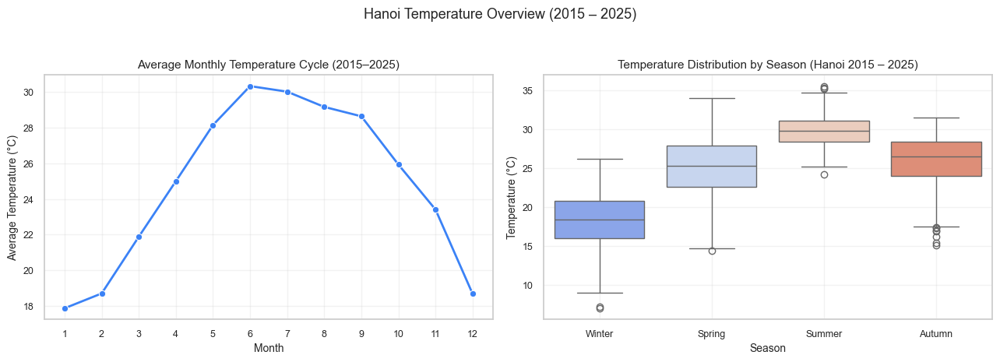

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns

# ==== Tạo 2 biểu đồ song song trong 1 figure ====
fig, axes = plt.subplots(1, 2, figsize=(13, 4.5), constrained_layout=True)

# --- Biểu đồ 1: Average temperature by month ---
monthly_temp = df.groupby('month', dropna=True)['temp'].mean().sort_index()

sns.lineplot(ax=axes[0], x=monthly_temp.index, y=monthly_temp.values,
             marker='o', linewidth=2, color='#3b82f6')
axes[0].set_title('Average Monthly Temperature Cycle (2015–2025)', fontsize=11)
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Average Temperature (°C)')
axes[0].set_xticks(range(1,13))
axes[0].grid(alpha=0.25)

# --- Biểu đồ 2: Boxplot by season ---
season_map = {12:'Winter', 1:'Winter', 2:'Winter',
              3:'Spring', 4:'Spring', 5:'Spring',
              6:'Summer', 7:'Summer', 8:'Summer',
              9:'Autumn', 10:'Autumn', 11:'Autumn'}
df['season'] = pd.Categorical(df['month'].map(season_map),
                              categories=['Winter','Spring','Summer','Autumn'], ordered=True)

sns.boxplot(ax=axes[1], data=df, x='season', y='temp',
            order=['Winter','Spring','Summer','Autumn'], palette='coolwarm')
axes[1].set_title('Temperature Distribution by Season (Hanoi 2015 – 2025)', fontsize=11)
axes[1].set_xlabel('Season')
axes[1].set_ylabel('Temperature (°C)')
axes[1].grid(alpha=0.25)

plt.suptitle('Hanoi Temperature Overview (2015 – 2025)', fontsize=13, y=1.03)
plt.tight_layout()
plt.show()


**Quick observation:**  
Hanoi exhibits a distinct four-season climate — with temperature peaks occurring in June–July (summer) and troughs in January–February (winter). The diurnal temperature range and the seasonal temperature background serve as the underlying context influencing the behavior of all secondary temperature-related variables.

### **Overall Correlation among Temperature Variables**

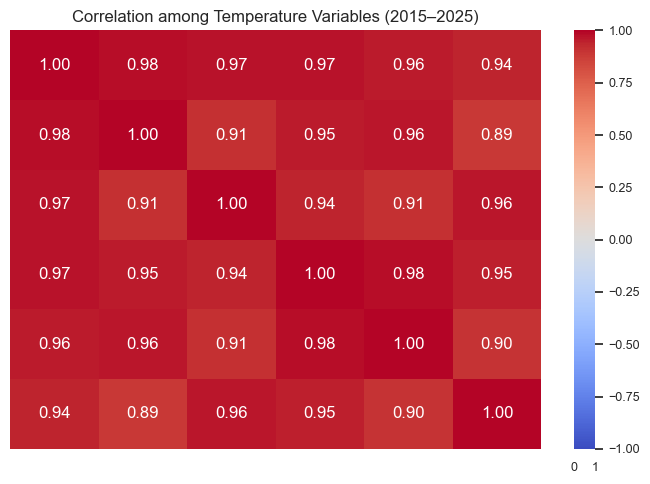

temp            1.000000
tempmax         0.977442
feelslike       0.973896
tempmin         0.969415
feelslikemax    0.957544
feelslikemin    0.942688
Name: temp, dtype: float64

In [9]:
cols = ['temp','tempmax','tempmin','feelslike','feelslikemax','feelslikemin']
corr_matrix = df[cols].corr()

plt.figure(figsize=(7,5))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation among Temperature Variables (2015–2025)')
_finalize_current_figure()
plt.show()

corr_matrix['temp'].sort_values(ascending=False)


## **1. Temperature & Thermal Perception**

### **1.1. Tempmax**

##### Domain Knowledge
- **Definition:** `tempmax` represents the **daily maximum temperature (°C)**, determined by the balance between daytime solar radiation, surface–air convection, and cloud or rainfall conditions.  
- **Controlling Factors:** solar radiation (reduced by clouds), humidity (high humidity limits heating), wind (enhances convection → local cooling), and urban surfaces (urban heat island effect).  
- **Seasonal Pattern in Hanoi:** peaks typically occur between **13:00–15:00**; summer temperatures reach **35–39°C**, while winter averages **20–25°C**.  
  The **day–night temperature range** is smaller during cloudy or rainy periods.  

##### Observed Pattern
- The scatter plot of `tempmax` vs. `temp` shows points **closely following the diagonal line**, indicating an almost linear relationship.  
- From **2015–2025**, `tempmax` fluctuates **in phase with `temp`**; during **El Niño years** (e.g., 2019, 2023), higher-than-average deviations are observed.  
- The **seasonal chart** reveals that the **diurnal temperature range decreases during the rainy season** due to increased cloud cover and humidity.


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15796\179936594.py:44: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


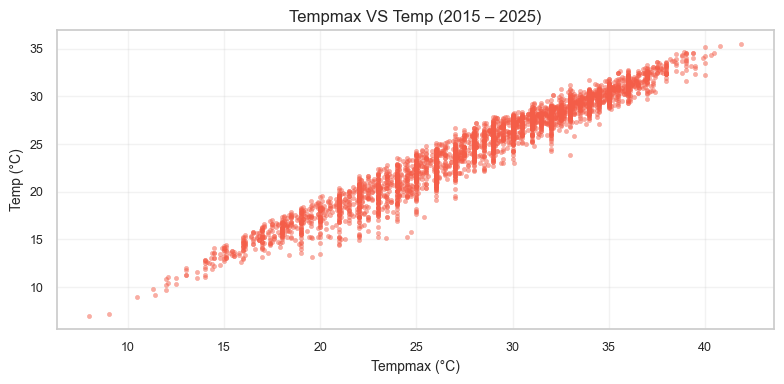

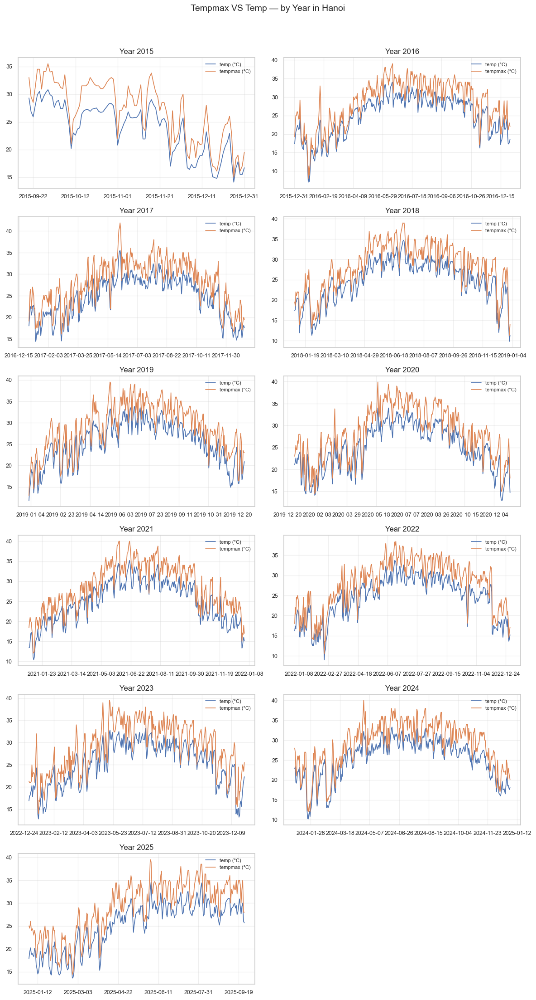

In [79]:
sns.scatterplot(x=df['tempmax'], y=df['temp'], s=10, alpha=0.5, edgecolor=None, color='#f45d48')
plt.title('Tempmax VS Temp (2015 – 2025)')
plt.xlabel('Tempmax (°C)'); plt.ylabel('Temp (°C)')
plot_pair_by_year(df, feature="tempmax", target="temp", title="Tempmax VS Temp — by Year in Hanoi", use_rolling=False)
_finalize_current_figure()
plt.show()


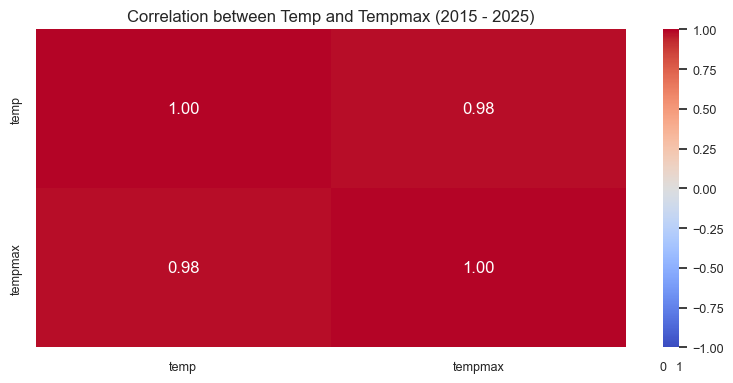

In [86]:
sns.heatmap(df[['temp','tempmax']].corr(), annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation between Temp and Tempmax (2015 - 2025)')
_finalize_current_figure()
plt.show()

#### **Hypothesis Testing**
`tempmax` has a strong and nearly linear positive relationship with temp, since the daily mean temperature is a function of both the maximum and minimum temperatures.
`tempmax` represents the peak thermal energy within a 24-hour period and therefore exerts a dominant influence on the overall trend of temp.  
- Pearson r ≈ 0.95 between temp and tempmax (stable across years).  
- The scatter plot is nearly linear, and the heatmap confirms a very strong positive correlation with few outliers.  
- This aligns with the radiation–convection physics: when the daily temperature peak rises, the overall daily mean inevitably increases.

#### **Conclusion**

1. **Decision:**  
Keep `tempmax` in the model. 

2. **Designing Lag and Rolling Features:**  
    - Recommended lags:  {1, 3} days — to capture short-term thermal inertia.
    - Recommended rolling windows: mean over {3, 7} days — to smooth out weekly fluctuations.

### **1.2. Tempmin**

##### Domain Knowledge

- **Definition:** `tempmin` represents the **daily minimum temperature** (°C), typically occurring around dawn (4–6 AM).  
  It is strongly influenced by **nighttime radiative cooling**, **cloud cover**, and **humidity**  
  (more clouds → heat retention → less nocturnal cooling).

- **Controlling factors:**  
  - **Cloud cover:** retains nighttime heat  
  - **Humidity:** enhances condensation → limits strong cooling  
  - **Wind:** mixes the boundary layer  
  - **Urban topography:** retains heat

##### Observed Pattern

- The scatter plot of `tempmin` vs. `temp` shows a **strong positive correlation**,  
  though with a **gentler slope than `tempmax`**;  
  data points are less concentrated along the diagonal due to **nighttime effects**.

- **Seasonal behavior:**  
  `tempmin` increases least during **winter** and peaks in **summer**;  
  the **seasonal amplitude** is **less abrupt** compared to `tempmax`.


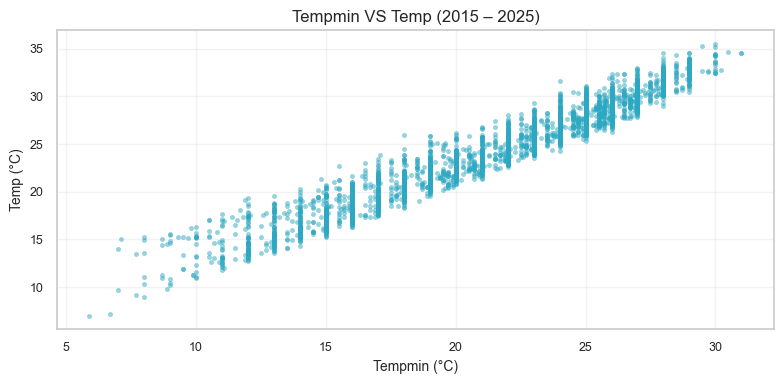

In [82]:
sns.scatterplot(x=df['tempmin'], y=df['temp'], s=10, alpha=0.5, edgecolor=None, color='#2ca8c2')
plt.title('Tempmin VS Temp (2015 – 2025)')
plt.xlabel('Tempmin (°C)'); plt.ylabel('Temp (°C)')
_finalize_current_figure()
plt.show()

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15796\179936594.py:44: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


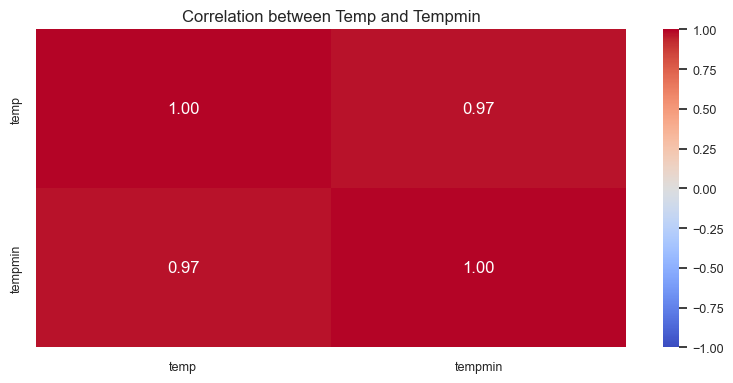

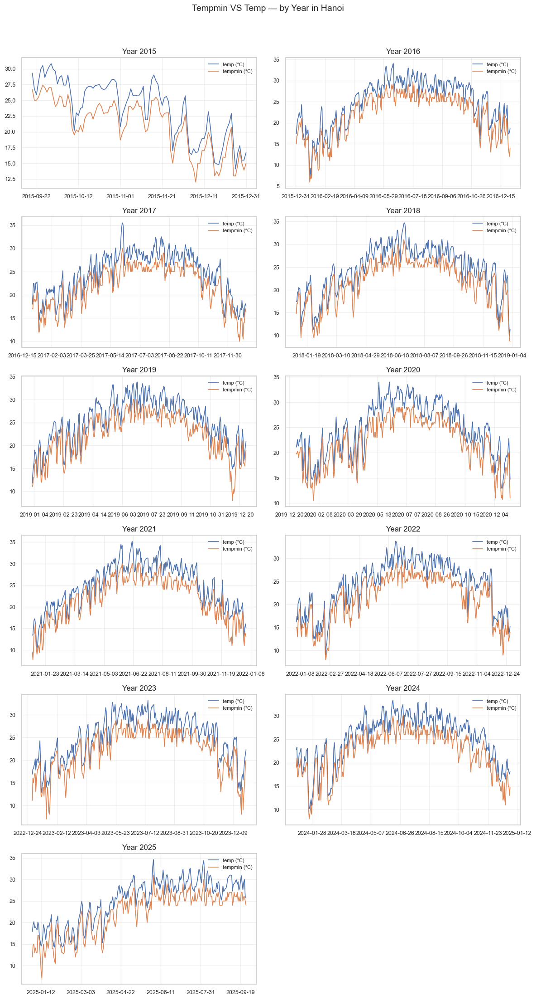

In [85]:
sns.heatmap(df[['temp','tempmin']].corr(), annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation between Temp and Tempmin')
plot_pair_by_year(df, feature="tempmin", target="temp", title="Tempmin VS Temp — by Year in Hanoi", use_rolling=False)
_finalize_current_figure()
plt.show()

#### **Hypothesis Testing**
`tempmin` reflects the **day–night thermal baseline**.  
When `tempmin` increases, `temp` also rises, but with a **lower sensitivity** compared to `tempmax`,  
due to the influence of **daytime heat accumulation**.

- **Pearson r ≈ 0.90** between `temp` and `tempmin`.  
- Both the scatter plot and heatmap confirm a **strong positive correlation**,  
  with **greater dispersion** caused by variations in **nighttime radiation**, **fog**, and **low cloud cover**.


#### **Conclusion**

1. **Decision:**  
Keep the variable `tempmin`

2. **Designing Lag and Rolling Features:**  
    - Lag: {1, 3, 7} days — to capture daily and weekly baseline temperature trends.  
    - Rolling: mean over {3, 7, 14} days — to represent longer-term thermal trends compared to `tempmax`.  
    - Suggestion: include the interaction term `tempmax − tempmin` (day–night temperature range)  
    as an auxiliary feature.

### **1.3. Feelslike**

##### Domain Knowledge

- **Definition:** `feelslike` (apparent temperature) estimates the **perceived temperature** experienced by humans,  
  combining the effects of **humidity** and **wind** on the actual air temperature.

- **Approximation of Steadman’s formula (temperate conditions):**  
  \[
  T_{feel} \approx T + 0.33\,RH - 0.70\,Wind - 4
  \]  
  where **RH** is the relative humidity (fraction 0–1 or %), and **Wind** is the wind speed in m/s.

- **Interpretation:**  
  - High humidity → feels **warmer** than actual temperature.  
  - Strong wind → feels **cooler** than actual temperature.

##### Observed Pattern

- `feelslike` generally **closely follows** `temp`, but shows **systematic deviations** driven by humidity and wind  
  (positive deviation in humid summers; negative deviation in windy winters).  
- The scatter plot with `temp` is **nearly linear**, with slightly higher noise under **extreme conditions**  
  (heavy rain, strong winds).


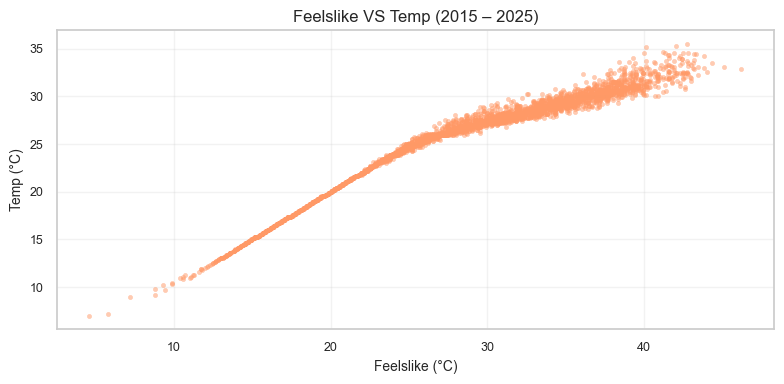

In [21]:
sns.scatterplot(x=df['feelslike'], y=df['temp'], s=10, alpha=0.5, edgecolor=None, color='#ff9966')
plt.title('Feelslike VS Temp (2015 – 2025)')
plt.xlabel('Feelslike (°C)'); plt.ylabel('Temp (°C)')
_finalize_current_figure()
plt.show()

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15796\179936594.py:44: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


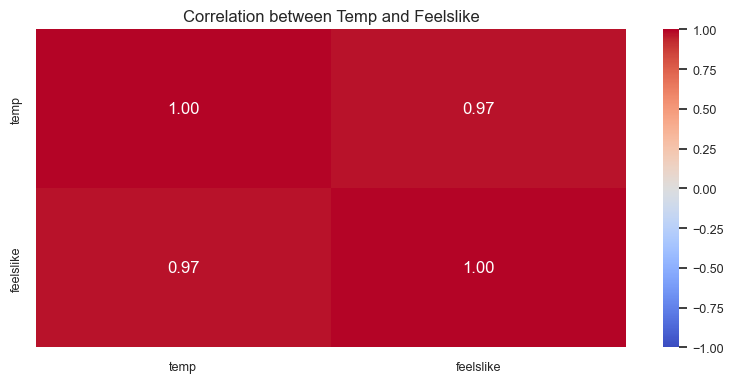

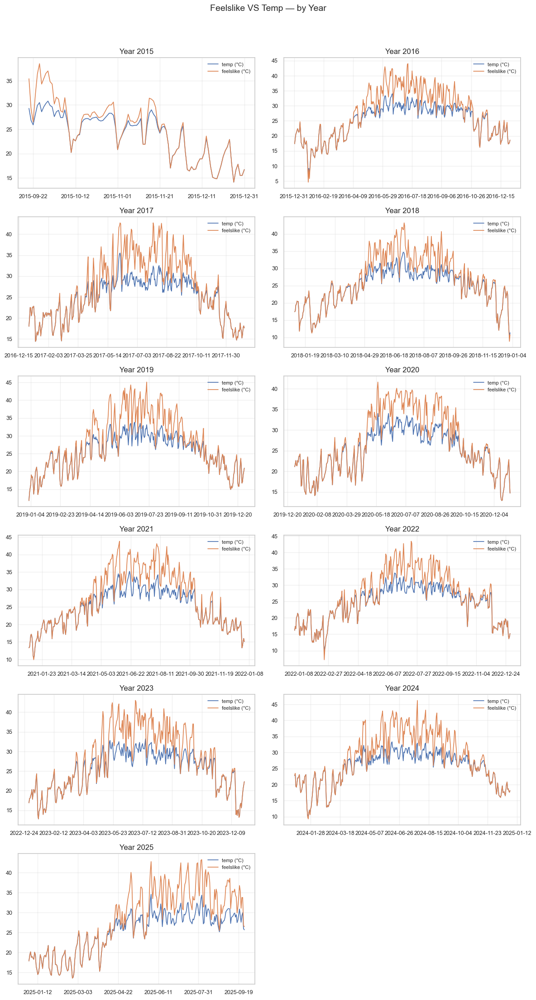

In [84]:
sns.heatmap(df[['temp','feelslike']].corr(), annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation between Temp and Feelslike')
plot_pair_by_year(df, feature="feelslike", target="temp", title="Feelslike VS Temp — by Year", use_rolling=False)
_finalize_current_figure()
plt.show()

#### **Hypothesis Testing**
 `feelslike` has a **strong positive correlation** with `temp`,  
serving as a good representation of **physiological thermal perception**.  
It reflects variations in `temp` quite faithfully, though it is **more sensitive** to humidity and wind.
- **Pearson r ≈ 0.95** between `temp` and `feelslike`.  
- Both the scatter plot and heatmap confirm this strong relationship;  
  **localized noise** appears on **rainy or windy days**.

#### **Conclusion**

1. **Decision:**  
Keep `feelslike` as a substitute or complementary variable for `temp`.

2. **Designing Lag and Rolling Features:**  
    - Lag: {1, 3} days — to capture short-term thermal perception inertia.  
    - Rolling: mean over {3, 7} days — to smooth out weekly fluctuations.  
    - Note: avoid information redundancy when multiple temperature variables are used;  
    check for **multicollinearity**.

### **1.4. Feelslikemax**

##### Domain Knowledge
- **Definition:** `feelslikemax` is the **maximum apparent temperature** during the day; it is usually **higher than `tempmax`** when humidity is high (heat index effect).  
- **Practical meaning:** It serves as a **heatwave risk indicator** for human health, representing the **highest physiological heat load** of the day.

##### Observed Pattern
- The **scatter plot with `temp`** shows a strong positive correlation but with slight **nonlinearity** (high humidity amplifies the perceived temperature faster).  
- **Prolonged heatwaves** tend to form **clusters in the high-value region**, revealing **extreme heat risk** patterns.


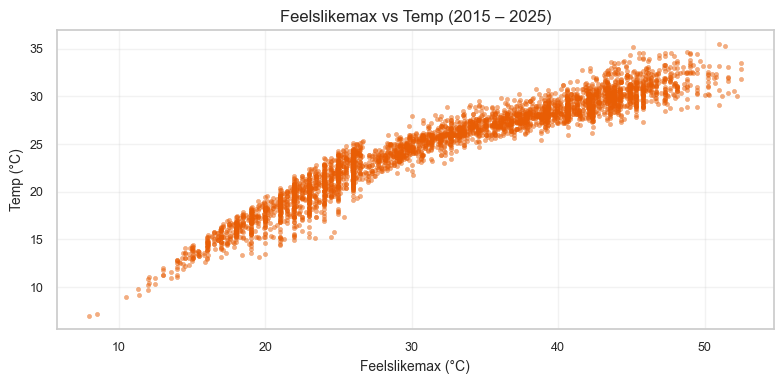

In [25]:
sns.scatterplot(x=df['feelslikemax'], y=df['temp'], s=10, alpha=0.5, edgecolor=None, color='#e85d04')
plt.title('Feelslikemax vs Temp (2015 – 2025)')
plt.xlabel('Feelslikemax (°C)'); plt.ylabel('Temp (°C)')
_finalize_current_figure()
plt.show()

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15796\179936594.py:44: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


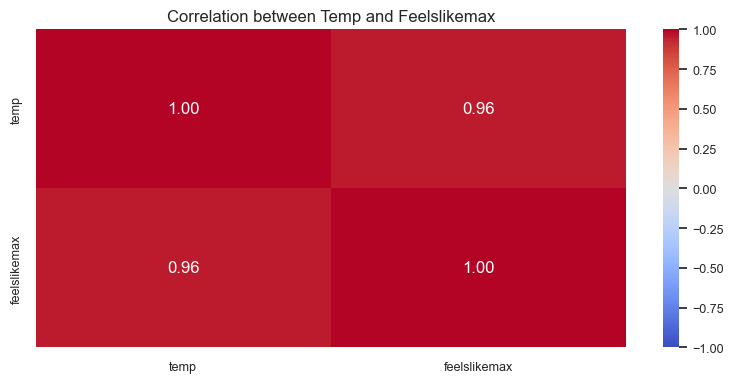

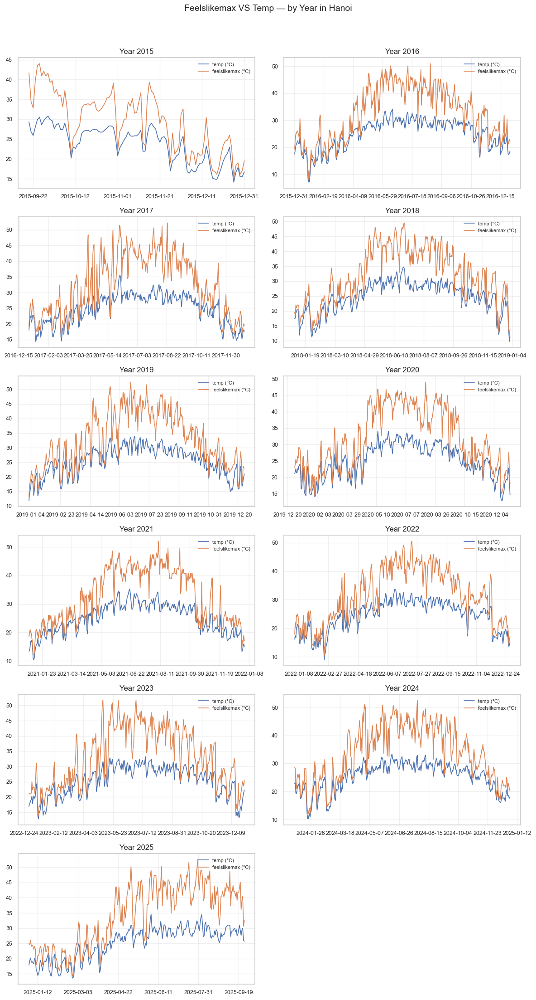

In [87]:
sns.heatmap(df[['temp','feelslikemax']].corr(), annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation between Temp and Feelslikemax')
plot_pair_by_year(df, feature="feelslikemax", target="temp", title="Feelslikemax VS Temp — by Year in Hanoi", use_rolling=False)
_finalize_current_figure()
plt.show()

#### **Hypothesis Testing**  
`feelslikemax` increases **in phase** with `temp`, but is **more sensitive** under high-humidity conditions; it may **improve heat prediction accuracy** compared to using only `tempmax`.  
  - **Pearson r ≈ 0.93** with `temp`.  
  - The **scatter plot** suggests slight **nonlinearity**, and the **heatmap** confirms a strong positive correlation.


#### **Conclusion**

1. **Decision:**  
Keep `feelslikemax` for models focusing on heat peaks / perceived temperature.  

2. **Designing Lag and Rolling Features:**  
    - Lag: {1, 3} days
    - Rolling: mean {3, 7}.  
    - Suggestion: Add a **binary variable** to flag **heatwave events** based on the `feelslikemax` threshold.

### **1.5. Feelslikemin**

##### Domain Knowledge
- **Definition:** `feelslikemin` represents the **lowest perceived temperature** during the day; it is usually **lower than** `tempmin` due to the **wind chill effect**.  
- **Practical Meaning:** It serves as an indicator of **cold stress risk**, especially for **sensitive groups** (elderly people, children).  

##### Observed Pattern  
- With `temp`, the relationship is **strongly positive**, but the **scatter is wider** during the **winter season** (when the Northeast monsoon intensifies the cold sensation).  
- Some **extreme cold days** show a **significant negative deviation** compared to `tempmin`.


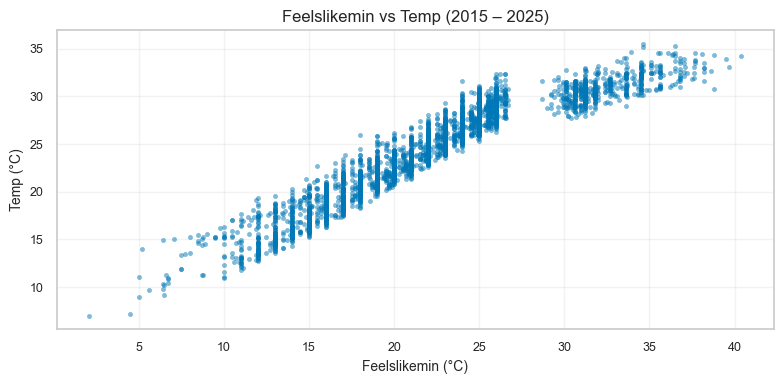

In [89]:
sns.scatterplot(x=df['feelslikemin'], y=df['temp'], s=10, alpha=0.5, edgecolor=None, color='#0077b6')
plt.title('Feelslikemin vs Temp (2015 – 2025)')
plt.xlabel('Feelslikemin (°C)'); plt.ylabel('Temp (°C)')
_finalize_current_figure()
plt.show()

C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15796\179936594.py:44: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


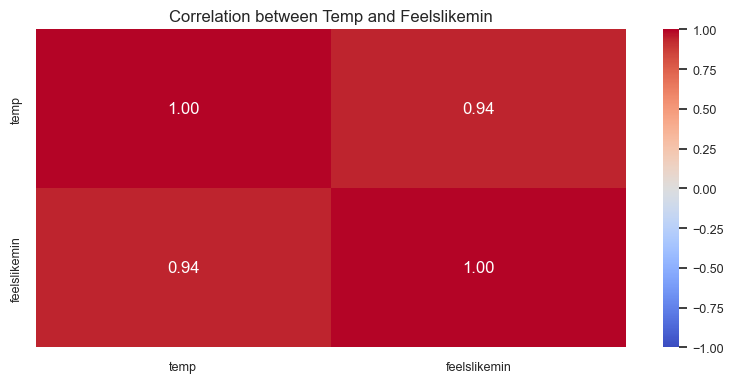

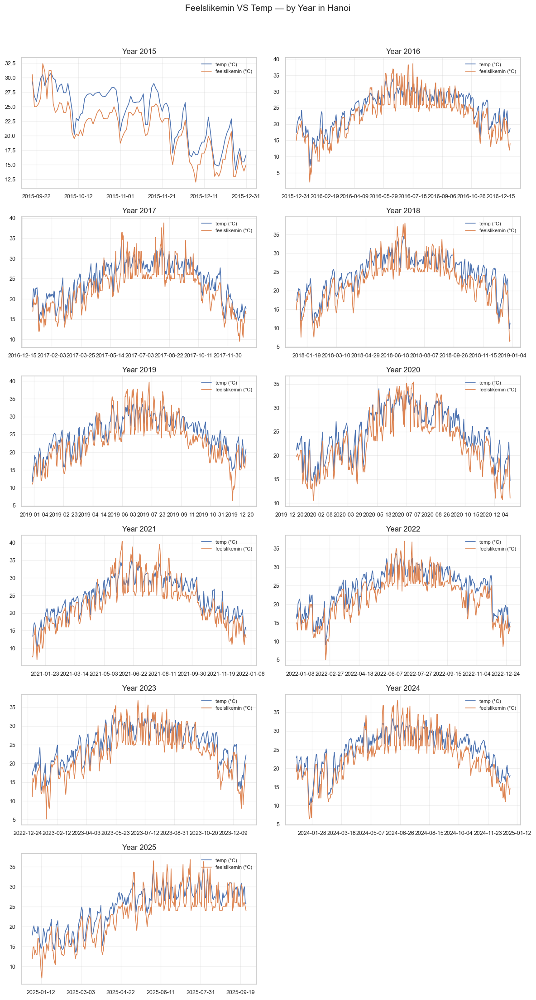

In [90]:
sns.heatmap(df[['temp','feelslikemin']].corr(), annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation between Temp and Feelslikemin')
plot_pair_by_year(df, feature="feelslikemin", target="temp", title="Feelslikemin VS Temp — by Year in Hanoi", use_rolling=False)

_finalize_current_figure()
plt.show()

#### **Hypothesis Testing**  
`feelslikemin` increases together with `temp` but is **more sensitive to wind**; therefore, it can better represent **cold perception** compared to using only `tempmin`.  
- **Pearson r ≈ 0.91** with `temp`.  
- **Scatter + heatmap** confirm a **strong positive correlation**, with more variation observed during **winter due to wind effects**.


#### **Conclusion**

1. **Decision:**  
Keep `feelslikemin` if the task focuses on cold risk assessment.  
2. **Designing Lag and Rolling Features:**  
    - Lag: {1, 3, 7}; 
    - Rolling: mean {3, 7, 14} to capture **stable cold trends**.  
    - Suggestion: Create a new variable `feelslikemax - feelslikemin` to measure the **day–night perceived temperature range**.



## **2. Dew and Precipitation**

### **2.1. Dew**

##### Domain Knowledge
**Dew point** is the temperature at which air (with a constant amount of water vapor) must be cooled to reach the state of water vapor saturation. When the air temperature drops to the dew point, the relative humidity becomes 100%, and water vapor begins to condense into liquid droplets (fog or clouds).

##### Calculation
The **dew point** is measured using meteorological instruments (hygrometers) and has the same unit as temperature. More importantly, unlike relative humidity, which is a relative measure dependent on temperature, the dew point is an absolute measure of the amount of water vapor in the air.  
A higher dew point indicates a greater amount of moisture in the atmosphere.

➡️ Therefore, the variable `dew` has a **strong positive correlation** with the target variable `temp`.


Correlation between Temperature and Dew Point: 0.9031


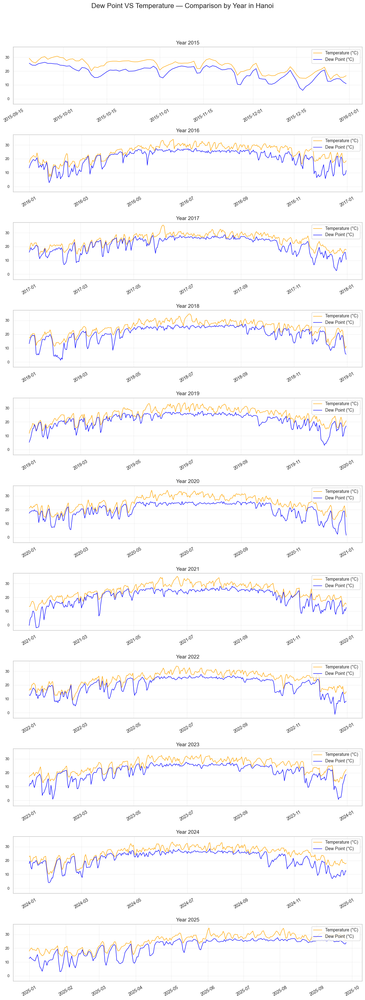

In [51]:
correlation_temp_dew = df['dew'].corr(df['temp'])
print(f'Correlation between Temperature and Dew Point: {correlation_temp_dew:.4f}')

# Vẽ 10 biểu đồ theo từng năm để so sánh
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df['year'] = df['datetime'].dt.year

# lấy danh sách năm từ dataframe (hoặc có thể đặt cố định)
years = sorted(df['year'].unique())
n = len(years)
ncols = 1
nrows = n

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 3 * nrows), sharey=True)
if nrows == 1:
    axes = [axes]
else:
    axes = axes.flatten()

for i, yr in enumerate(years):
    ax = axes[i]
    dfi = df[df['year'] == yr].sort_values('datetime')
    ax.plot(dfi['datetime'], dfi['temp'], label='Temperature (°C)', color='orange', linewidth=1)
    ax.plot(dfi['datetime'], dfi['dew'], label='Dew Point (°C)', color='blue', linewidth=1)
    ax.set_title(f'Year {yr}')
    ax.set_xlabel('')
    ax.legend(loc='upper right', fontsize='small')
    ax.tick_params(axis='x', rotation=30, labelsize='small')

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

fig.suptitle('Dew Point VS Temperature — Comparison by Year in Hanoi', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

- **The Dew Point is the "floor" of temperature:** Physically, the dew point line (blue) always lies below or equals the temperature line (orange).
- **Distance = Humidity:** The distance between the two lines is a visual indicator of relative humidity.
    - **Close together:** High humidity (humid, damp).
    - **Far apart:** Low humidity (dry).

#### **Seasonal Relationship Between Temperature and Dew Point in Hanoi**

##### **1. Humid Season (Late Winter – Early Spring, around late January to April)**
- **Characteristics:** This is the period when the `Temperature` and `Dew Point` lines are closest to each other — on many days, they almost “touch.”
- **Explanation:** Although the overall temperature remains low (cold), the air contains a large amount of water vapor, causing the dew point to nearly catch up with the temperature.  
  This is the characteristic *“nồm ẩm”* (humid) phenomenon, leading to relative humidity above 90%.  
  Charts from recent years clearly show this seasonal pattern.

##### **2. Hot and Humid Season (Summer, around May to September)**
- **Characteristics:** Both `Temperature` and `Dew Point` rise to their highest levels of the year, with a relatively stable distance between them.
- **Explanation:** This is summer — high temperatures come with high moisture content (high dew point), creating a *muggy* or *oppressive* feeling.

##### **3. Transitional / Dry Season (Autumn – Winter, around October to January)**
- **Characteristics:** Both lines show a downward trend. This is when the distance between the two lines fluctuates the most.
- **Explanation:** This phase is dominated by northeast monsoon winds.
    - When a strong, dry, and cold monsoon front arrives, it pushes away moisture, causing the dew point (blue line) to drop sharply.  
      This creates a large gap between the two lines, leading to *dry and cold* weather.
    - When the monsoon weakens, moisture returns, and the two lines move closer again.


#### **Conclusion**

1. **Decision:** The variable `dew` should be included in the temperature prediction model.

2. **Feature Engineering Suggestions:**
    - **Lag features:** `dew_lag_1`, `dew_lag_2`, `dew_lag_3`, `dew_lag_7`
    - **Rolling features:** `dew_roll_mean_7`, `dew_roll_mean_14`, `dew_roll_std_7`, `dew_roll_std_14`
    - **Difference feature:**  
      `temp_dew_diff` = `temp` - `dew`  
      (*Note:* This feature directly **quantifies** the distance observed visually between the two lines on the chart.  
      It provides the model with highly valuable information to distinguish between different weather states — **humid**, **muggy**, and **dry** — thereby improving temperature prediction accuracy.)


### **2.2. Humidity**

##### Domain Knowledge
**Relative Humidity (RH)** is the percentage ratio of the actual amount of water vapor in the air to the maximum amount of water vapor the air can hold at a given temperature.  
When temperature increases, the air’s capacity to hold moisture also increases — therefore, if the amount of water vapor remains constant, relative humidity decreases.  

*Example:*  
Cold air at 10°C with 90% humidity actually contains less water vapor than warm air at 30°C with only 60% humidity.

##### Predicting Observed Patterns and Seasonal Rules (for Hanoi Weather)

- **Inverse relationship with daily temperature:**  
  On dry days (without rain), when the temperature peaks around noon or early afternoon, relative humidity usually drops to its lowest point — and vice versa.

- **Seasonal patterns:**
    - **Summer (May–September):**  
      The rainy and hot-humid season.  
      Daily average humidity often remains high (typically above 75–80%) due to large amounts of moisture in the air and frequent rainfall.
    - **Winter (December–February):**  
      Two distinct patterns occur:  
        - During dry northeast monsoon periods ("dry and cold"), humidity drops very low.  
        - During the *“nồm ẩm”* phase (late winter to early spring), humidity becomes extremely high, often exceeding 90%.

- **Dual role of humidity:**
    - **Daytime:** High humidity is often associated with cloud cover, which reduces solar radiation and can prevent the daytime temperature (`tempmax`) from rising too high.  
    - **Nighttime:** Clouds (formed from moisture) act like an insulating “blanket,” trapping heat radiating from the ground, preventing nighttime temperatures (`tempmin`) from dropping too low.


Correlation between Temperature and Humidity: 0.1312


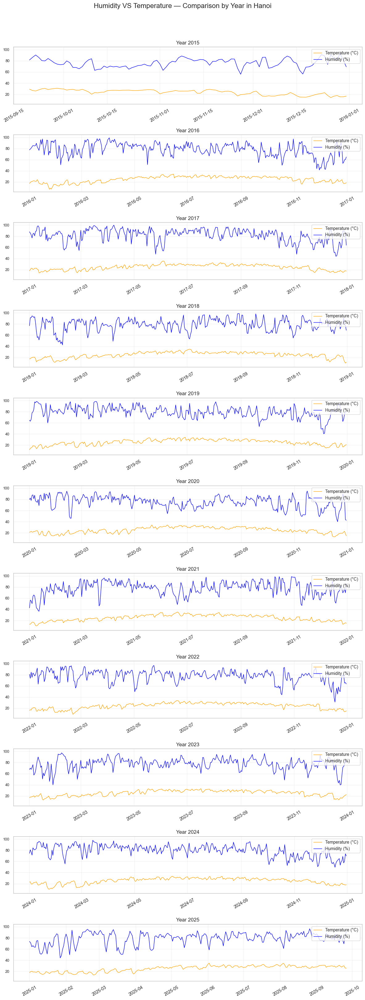

In [50]:
correlation_temp_humidity = df['humidity'].corr(df['temp'])
print(f'Correlation between Temperature and Humidity: {correlation_temp_humidity:.4f}')

# Vẽ 10 biểu đồ theo từng năm để so sánh
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df['year'] = df['datetime'].dt.year

# lấy danh sách năm từ dataframe (hoặc có thể đặt cố định)
years = sorted(df['year'].unique())
n = len(years)
ncols = 1
nrows = n

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 3 * nrows), sharey=True)
if nrows == 1:
    axes = [axes]
else:
    axes = axes.flatten()

for i, yr in enumerate(years):
    ax = axes[i]
    dfi = df[df['year'] == yr].sort_values('datetime')
    ax.plot(dfi['datetime'], dfi['temp'], label='Temperature (°C)', color='orange', linewidth=1)
    ax.plot(dfi['datetime'], dfi['humidity'], label='Humidity (%)', color='blue', linewidth=1)
    ax.set_title(f'Year {yr}')
    ax.set_xlabel('')
    ax.legend(loc='upper right', fontsize='small')
    ax.tick_params(axis='x', rotation=30, labelsize='small')

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

fig.suptitle('Humidity VS Temperature — Comparison by Year in Hanoi', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### **Seasonal Relationship Between Temperature and Humidity in Hanoi**

##### **1. Humid Season (Late Winter – Spring, around February to April)**
- **Chart observations:**
    - Temperature (orange) shows a gradual upward trend following the winter period.  
    - Humidity (blue) consistently reaches its annual peaks, frequently staying above 85%, with many days reaching 95–100%.
- **Interpretation (Pattern):**
    - This is the period when humidity reaches and maintains its highest and most stable levels.  
      Although temperatures are not yet at their summer peak, the air is saturated with moisture, creating the characteristic *“nồm ẩm”* (damp and clammy) phenomenon.

##### **2. Hot and Humid Season (Summer, around May to September)**
- **Chart observations:**
    - Temperature (orange) reaches its annual maximum, forming a “plateau” of high temperatures.  
    - Humidity (blue) remains high overall but becomes much more variable and “spiky” compared to spring — with sudden drops and sharp peaks.
- **Interpretation (Pattern):**
    - This stage features high but unstable humidity accompanying high temperatures.  
      The fluctuations result from Hanoi’s typical summer weather: scorching hot days (causing relative humidity to drop) alternating with sudden showers or thunderstorms (causing humidity to surge to 100%).

##### **3. Dry Season (Autumn – Winter, around October to January)**
- **Chart observations:**
    - Temperature (orange) begins to decline noticeably.  
    - Humidity (blue) starts showing the deepest “valleys” of the year — this is the only period when relative humidity can drop below 50–60% for several consecutive days.
- **Interpretation (Pattern):**
    - This is the period when both temperature and humidity decrease together, characterized by dry, cool air brought by northeast monsoon winds.  
      The deep “valleys” on the chart correspond precisely to *dry-cold* weather episodes known locally as *“hanh khô.”*


#### **Conclusion**

1. **Decision:** The variable `humidity` should be included in the temperature prediction model.  
   Although its linear correlation may be low, `humidity` provides a different perspective on the atmospheric state that `dew` alone cannot capture.  
   It indicates how close the air is to saturation — a key factor in cloud formation and precipitation.

2. **Feature Engineering Suggestions:**
    - **Lag features:** `humidity_lag_1`, `humidity_lag_2`, `humidity_lag_3`, `humidity_lag_7`
    - **Rolling features:** `humidity_roll_mean_7`, `humidity_roll_mean_14`, `humidity_roll_std_7`, `humidity_roll_std_14`
    - **Interaction feature:**  
      `heat_index` = `temp` * `humidity`  
      (*A “feels-like” index combining temperature and humidity to represent perceived heat.*)


### **2.3. Precip**

##### Domain Knowledge
**Precipitation** is the total amount of water that falls from the atmosphere over a specific period of time, measured in millimeters (mm).  
Rain can influence air temperature in several ways:

- **Cooling effect:** When rain falls, it absorbs heat from the air as it evaporates, leading to a drop in temperature.  
  As a result, temperatures often decrease after rainfall.
- **Increase in humidity:** Rain increases the relative humidity of the air, which can make the temperature *feel* warmer due to the heat–moisture effect.

##### Predicting Observed Patterns and Seasonal Rules (for Hanoi Weather)

- **Inverse relationship:**  
  Generally, when precipitation increases, temperature tends to decrease due to the cooling effect of rain.

- **Seasonal patterns:**
    - **Rainy season (May–September):**  
      High precipitation; daytime temperatures may not rise too much due to cloud cover and the cooling effect of rainfall.
    - **Dry season (October–April):**  
      Low precipitation; daytime temperatures may rise higher because of fewer clouds and the absence of rain’s cooling effect.

- **Short-term impacts:**  
  Precipitation can influence temperature over short periods (hours or days), but this relationship may be less clear in daily or monthly datasets,  
  as other factors such as solar radiation, wind, and humidity also play major roles in temperature regulation.

➡️ Therefore, the variable `precipitation` is likely to have a **weak negative correlation** with `temp`.


Correlation between Temperature and Precipitation: 0.0920


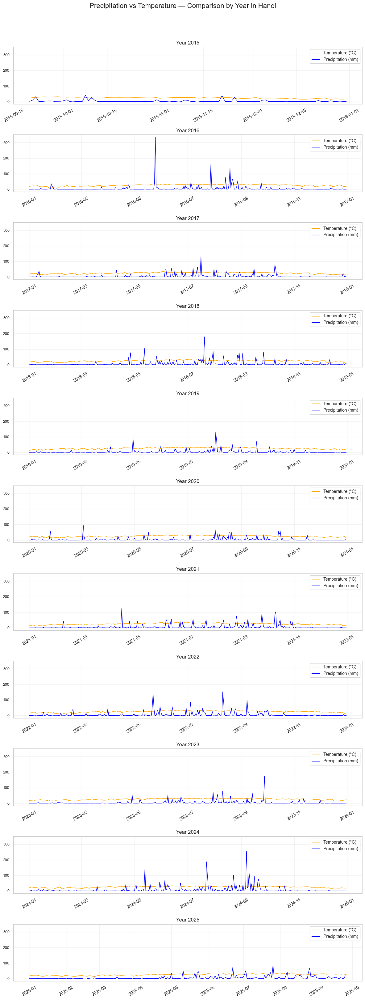

In [49]:
correlation_temp_precip = df['precip'].corr(df['temp'])
print(f'Correlation between Temperature and Precipitation: {correlation_temp_precip:.4f}')

# Vẽ 10 biểu đồ theo từng năm để so sánh
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df['year'] = df['datetime'].dt.year

# lấy danh sách năm từ dataframe (hoặc có thể đặt cố định)
years = sorted(df['year'].unique())
n = len(years)
ncols = 1
nrows = n

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 3 * nrows), sharey=True)
if nrows == 1:
    axes = [axes]
else:
    axes = axes.flatten()

for i, yr in enumerate(years):
    ax = axes[i]
    dfi = df[df['year'] == yr].sort_values('datetime')
    ax.plot(dfi['datetime'], dfi['temp'], label='Temperature (°C)', color='orange', linewidth=1)
    ax.plot(dfi['datetime'], dfi['precip'], label='Precipitation (mm)', color='blue', linewidth=1)
    ax.set_title(f'Year {yr}')
    ax.set_xlabel('')
    ax.legend(loc='upper right', fontsize='small')
    ax.tick_params(axis='x', rotation=30, labelsize='small')

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

fig.suptitle('Precipitation vs Temperature — Comparison by Year in Hanoi', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### **General Rainfall Patterns in Hanoi**

##### **1. Overall Pattern: A Clear Distinction Between Rainy and Dry Seasons**

This is the most prominent and consistent pattern observed across all years.  
Hanoi’s climate year can be distinctly divided into two separate seasons:

- **Dry Season (around November to April):**
    - **Chart observations:**  
      The rainfall line (blue) remains almost completely flat at 0. There are virtually no noticeable rainfall spikes.
    - **Interpretation:**  
      This is the period of minimal precipitation, with predominantly dry weather.  
      Rainfall is not a major factor influencing daily temperature changes during this season.

- **Rainy Season (around May to October):**
    - **Chart observations:**  
      All major and frequent rainfall peaks are concentrated within this period.  
      Blue rainfall bars appear regularly, with some days showing exceptionally high rainfall — often exceeding 100 mm or even 150 mm.
    - **Interpretation:**  
      This is Hanoi’s primary monsoon and storm season.  
      Rain becomes a frequent and dominant weather phenomenon, significantly influencing temperature variation.

##### **2. Supplementary Pattern: “Event-Driven” Nature and “Instant Cooling” Effect**

- **Event-Driven Nature:**
    - **Chart observations:**  
      Unlike temperature, which varies smoothly, rainfall occurs as sudden “events.”  
      The rainfall line doesn’t rise and fall gradually — instead, it spikes sharply from 0 to a high value, then immediately drops back to 0.
    - **Interpretation:**  
      This indicates that `precip` is not a continuous variable but a record of discrete events.  
      Therefore, creating a binary flag such as `is_rainy` (rain/no rain) can be highly effective for modeling purposes.

- **Instant Cooling Effect:**
    - **Chart observations:**  
      Notice that whenever a high rainfall peak (blue) occurs, the temperature line (orange) often shows a brief “pause” or a slight “dip” compared to its general trend.
    - **Interpretation:**  
      This perfectly illustrates the negative correlation between rainfall and temperature.  
      A heavy rain event can interrupt a temperature rise or cause a temporary cooling effect within the same day.


#### **Conclusion**

1. **Decision:**   
      The variable `precip` should be included in the temperature prediction model.  
   Although its correlation with temperature is weakly negative, `precipitation` provides valuable information about key weather events that can have an immediate impact on temperature.  
   Charts show that rainfall — though infrequent — has a clear and consistent effect on temperature, especially during the rainy season.

2. **Feature Engineering Suggestions:**
    - **Lag features:** `precip_lag_1`, `precip_lag_2`, `precip_lag_3`, `precip_lag_7`
    - **Rolling features:** `precip_roll_mean_7`, `precip_roll_mean_14`, `precip_roll_std_7`, `precip_roll_std_14`
    - **(Optional)** `precip_roll_sum_30` *(and possibly 60 or 90)*:  
      Charts clearly show two distinct seasons.  
      This variable helps the model **encode that seasonal separation** — its values automatically rise during the rainy season (May–October) and drop toward zero during the dry season (November–April), providing a highly reliable seasonal indicator.


### **2.4. Precipprob**

##### Domain Knowledge
- **Definition:**  
  `precipprob` (or `precipchance` in some documentation) represents the probability of precipitation during a given period, expressed as a percentage (0–100%).

- **Critical point:**  
  For the historical dataset you are using, this definition changes entirely.  
  According to Visual Crossing’s documentation:  
  `precipprob` is 100% if any precipitation was recorded, and 0% if no precipitation occurred.

- **Implication:**  
  In your dataset, `precipprob` is not a continuous probability variable — it is effectively a **binary flag**, an on/off switch indicating whether rain occurred.

##### Relationship with `precip`

- This leads to a direct consequence: `precipprob` and `precip` are almost redundant variables.  
  - If `precip > 0`, then `precipprob = 100`.  
  - If `precip = 0`, then `precipprob = 0`.  
  - They convey nearly identical information.

##### Observed Pattern

- Since it serves as a rain indicator, its pattern is **identical to `precip`**:  
  - The value **0** dominates during the dry season.  
  - The value **100** appears frequently during the rainy season.

##### Assumptions

- `precipprob` will take only two distinct values: 0 and 100.  
- It will have an extremely high correlation with `precip`, making it largely redundant.  
- Similar to `precip`, days with `precipprob = 100` are expected to have lower average temperatures compared to days with `precipprob = 0`.


Unique values and their counts in Precipitation Probability:
precipprob
100    2632
0      1028
Name: count, dtype: int64

Correlation coefficient between 'precipprob' and 'precip': 0.2040


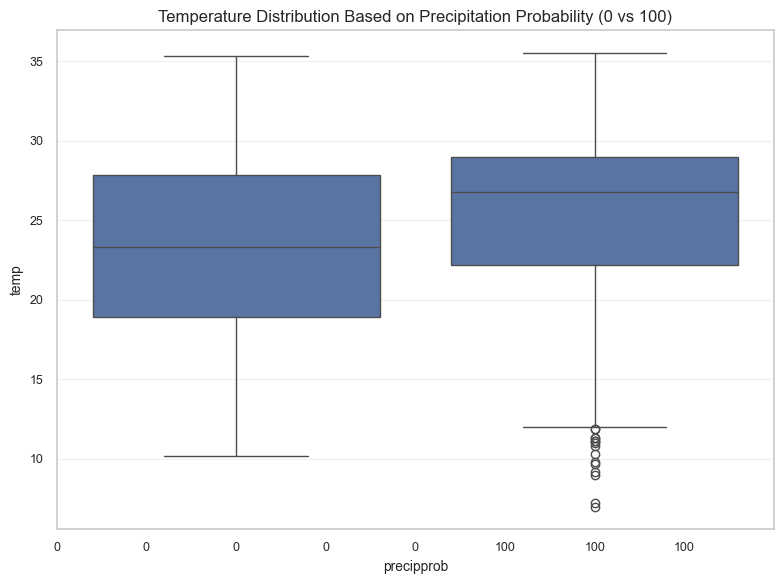

In [39]:
# 1. Check unique values
print("Unique values and their counts in Precipitation Probability:")
print(df['precipprob'].value_counts())

# 2. Calculate the correlation coefficient with 'precip'
# Note: There may be NaN values if either column contains NaN, so handle them beforehand if necessary.
correlation_with_precip = df['precipprob'].corr(df['precip'])
print(f"\nCorrelation coefficient between 'precipprob' and 'precip': {correlation_with_precip:.4f}")

# 3. Visualize using a Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='precipprob', y='temp')
plt.title('Temperature Distribution Based on Precipitation Probability (0 vs 100)')
_finalize_current_figure()
plt.show()


#### **Conclusion**

**Decision:**  
&nbsp;&nbsp;&nbsp;&nbsp; It is not necessary to include the variable `precipprob` in the temperature prediction model.  
It does not provide any additional information beyond what `precip` already offers.  
In fact, it is even less valuable than `precip` because it removes information about rainfall intensity —  
whether it rains 1 mm or 100 mm, `precipprob` still takes the same value of 100.

&nbsp;&nbsp;&nbsp;&nbsp; Keeping both redundant features can unnecessarily increase model complexity  
and may introduce **multicollinearity**, which can negatively affect certain types of models.


### **2.5. Precipcover**

##### Domain Knowledge

- **Definition:**  
  `precipcover` represents the proportion of time during which measurable precipitation occurs within a specific period, expressed as a percentage (%).  
  - *Example:* If it rains for 6 hours out of a 24-hour day, `precipcover` = 25%.

- **Difference from `precip` and `precipprob`:**
    - `precip`: Measures **the amount** of rainfall (how much rain fell).  
    - `precipprob` (in historical data): Measures **the occurrence** of rain (yes/no).  
    - `precipcover`: Measures **the duration** of rainfall (how long it lasted).

- **Special Note:**  
  According to Visual Crossing’s documentation, `precipcover` may capture even very light rainfall (trace precipitation) that `precip` might record as 0.  
  This means `precipcover` is slightly more sensitive to insignificant or short-lived rain events.

##### Observed Pattern

- **High correlation with other rainfall variables:**  
  A day with a high rainfall amount (`precip`) almost always corresponds to a long rainfall duration (`precipcover`).  
  The three variables — `precip`, `precipprob`, and `precipcover` — each describe different aspects of the same physical phenomenon: **rain**.  
  Therefore, they will be **highly correlated** with each other.

- **Impact on temperature:**  
  Similar to `precip`, a high `precipcover` (longer rain duration) means prolonged cloud cover, which reduces solar radiation and consequently lowers temperature.

##### Assumptions

- `precipcover` will have a **negative correlation** with `temp`, especially with `tempmax`.  
- `precipcover` will have a **very high positive correlation** with `precip` and `precipprob`, indicating that it is a **redundant feature**.


Correlation coefficient between Precipitation Cover and Temperature: 0.1138
Correlation coefficient between Precipitation Cover and Precipitation: 0.2224


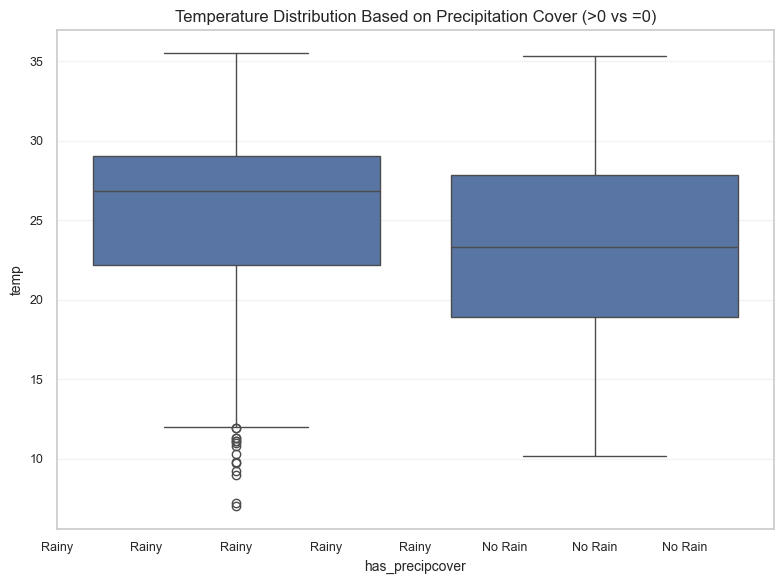

In [41]:
# 1. Calculate correlation coefficient with temperature
correlation_temp = df['precipcover'].corr(df['temp'])
print(f"Correlation coefficient between Precipitation Cover and Temperature: {correlation_temp:.4f}")

# 2. Check redundancy by calculating correlation with 'precip'
correlation_with_precip = df['precipcover'].corr(df['precip'])
print(f"Correlation coefficient between Precipitation Cover and Precipitation: {correlation_with_precip:.4f}")

# 3. Visualize using a Box Plot
df['has_precipcover'] = np.where(df['precipcover'] > 0, 'Rainy', 'No Rain')
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='has_precipcover', y='temp')
plt.title('Temperature Distribution Based on Precipitation Cover (>0 vs =0)')
_finalize_current_figure()
plt.show()


### **Observations & Result Analysis**

The analysis produced surprising findings — completely opposite to the initial assumptions.

1. **Correlation with `precip` (rainfall amount) is very low (0.22):**  
    * **Initial assumption:** The longer it rains (`precipcover` high), the greater the rainfall (`precip`) → Correlation should be high.  
    * **Reality:** The correlation is very low. This proves that `precipcover` and `precip` are **not redundant**; they measure different aspects of rainfall.

2. **Correlation with `temp` (temperature) is POSITIVE (0.11):**  
    * **Initial assumption:** The longer it rains, the cooler it should get → Correlation should be negative.  
    * **Reality:** The correlation is positive — which seems counterintuitive, as if “the longer it rains, the hotter it gets.”

### **Explanation: The Story of Hanoi’s “Two Types of Rain”**

The unexpected numbers arise because the Pearson correlation only captures simple linear relationships.  
It is “fooled” by the coexistence of two distinct types of rain in Hanoi’s climate data:

| Type of Rain | Characteristics | Effect on Variables |
| :--- | :--- | :--- |
| ⛈️ **Summer Thunderstorms** | - **Rainfall amount (`precip`) is VERY HIGH.** <br> - **Rain duration (`precipcover`) is SHORT.** <br> (Heavy downpours lasting only a few hours) | - `precip` high, `precipcover` low. <br> - Causes sharp temperature drops. |
| 🌧️ **Drizzling Rain (Spring “Nồm” Season)** | - **Rain duration (`precipcover`) is VERY LONG.** <br> (Light rain or drizzle lasting all day) <br> - **Rainfall amount (`precip`) is VERY LOW.** | - `precipcover` high, `precip` low. <br> - Occurs in mild temperatures (18–22°C). |

**Interpretation of correlation coefficients:**
- **Why is `precipcover`–`precip` correlation low?**  
  Because these two rain types form two opposite clusters: (large amount, short duration) and (small amount, long duration).  
  A single straight line cannot describe both, resulting in a low correlation coefficient.
- **Why is `precipcover`–`temp` correlation positive?**  
  Drizzling days with high `precipcover` often occur in spring, when temperatures (18–22°C) are higher than the driest winter days (10–15°C).  
  The statistical algorithm “misinterprets” high `precipcover` as being associated with relatively warmer temperatures, shifting the correlation toward positive.

#### **New Conclusion & Updated Decision (Highly Important)**

This analysis completely overturns the initial conclusion.

1. **Decision:** 
   Definitely keep `precipcover`. 
   This variable is not redundant — it provides extremely valuable information that `precip` misses:  
   it serves as a **signature indicator of the “humid nồm” weather pattern.**

2. **New strategy for the rainfall-related feature group:**
    * `precip`: Used to identify **heavy, high-intensity rain events** (summer thunderstorms).  
    * `precipcover`: Used to identify **prolonged, low-intensity humid periods** (drizzling “nồm” conditions).

    => **Action:** Keep both `precip` and `precipcover`.  
    They are **complementary, not redundant**.  
    A well-designed model (especially tree-based models) can learn complex relationships such as:
    * `IF precip > 50mm THEN temp drops significantly.`
    * `IF precip < 1mm AND precipcover > 50% THEN this is a humid nồm day, temp ≈ 20°C.`


### **2.6. Preciptype**

##### Domain Knowledge

- **Definition:**  
  `preciptype` describes the **type of precipitation**, such as `"rain"`, `"snow"`, `"freezing rain"`, or `"ice"`.

- **Data characteristics:**  
  This is a **categorical variable**, with its values represented as text strings.

##### Observed Patterns and Rules (Specific to Hanoi’s Climate)

- **Uniformity:**  
  Hanoi has a tropical monsoon climate, meaning there is **no snow or ice**.  
  Therefore, if precipitation occurs, the recorded type will almost certainly be `"rain"`.

- **Missing values (NaN):**  
  On days without rainfall, the `preciptype` field will most likely be empty (missing or NaN — *Not a Number*).

- **Relationship with other precipitation variables:**  
  This column effectively serves as another indicator for “rain occurrence.”  
  If `preciptype` has a value (not NaN), it means that it rained on that day.

##### Assumptions

- The `preciptype` column will contain only a few unique values — primarily `"rain"` and missing values (`NaN`).  
- It will be a **redundant feature** compared with other rainfall-related variables such as `precip` or `precipprob`, since it merely indicates whether it rained or not,  
  without providing any new information about rainfall **intensity**, **duration**, or **type** (as Hanoi only experiences rain).


Types of precipitation and their counts:
preciptype
rain    2673
NaN      987
Name: count, dtype: int64


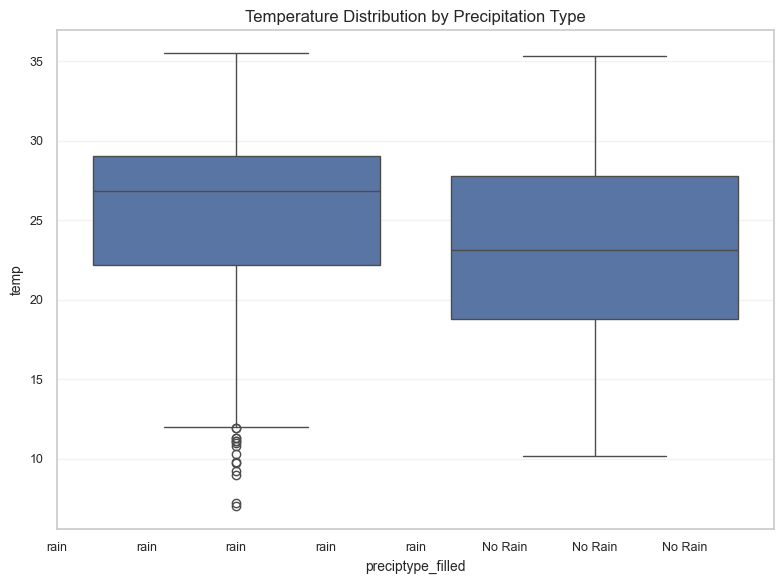

In [42]:
# 1. Check unique values, including NaN
print("Types of precipitation and their counts:")
print(df['preciptype'].value_counts(dropna=False))

# 2. Visualize using a Box Plot
# To plot the chart, fill NaN values with "No Rain"
df['preciptype_filled'] = df['preciptype'].fillna('No Rain')

plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='preciptype_filled', y='temp')
plt.title('Temperature Distribution by Precipitation Type')
_finalize_current_figure()
plt.show()


#### **Conclusion**

It is **not necessary** to include the variable `preciptype` in the temperature prediction model.  
This feature does not provide any new information beyond what is already captured by other precipitation-related variables.  
In fact, it is less informative because it only indicates whether precipitation occurred (“rain” or missing) without providing any detail about amount, duration, or intensity.  

Since `preciptype` in Hanoi’s dataset contains almost only `"rain"` and missing values (NaN),  
keeping it would introduce redundancy and unnecessary categorical noise to the model without improving prediction accuracy.


## **3. Wind and Visbility**

### **3.1. Windgust**

##### Domain Knowledge
**Wind gust** is the short-duration peak wind speed—a brief burst stronger than the “sustained” (average) wind. It reflects turbulence, convection, fronts, thunderstorms, sea-breeze surges, or topographic channeling.  
- **Measurement**:  
Instrument: cup or sonic anemometer mounted ~10 meters above ground over open terrain.


Sampling/averaging: the sensor records high-frequency wind; a gust is computed as the maximum short-window average (e.g., a few seconds) observed within a longer observation period (minutes to a day).


In daily datasets: the value is usually the daily maximum gust observed at the station or aggregated from hourly data.  
- **Formula**:  
If 𝑣(𝑡) is the instant wind speed, a gust over a short window Δ (e.g., 3 s) within a day D can be idealized as:  
$$
gust_D = \max_{t \in D} \frac{1}{\Delta} \int_{t}^{t+\Delta} v(\tau)\, d\tau
$$



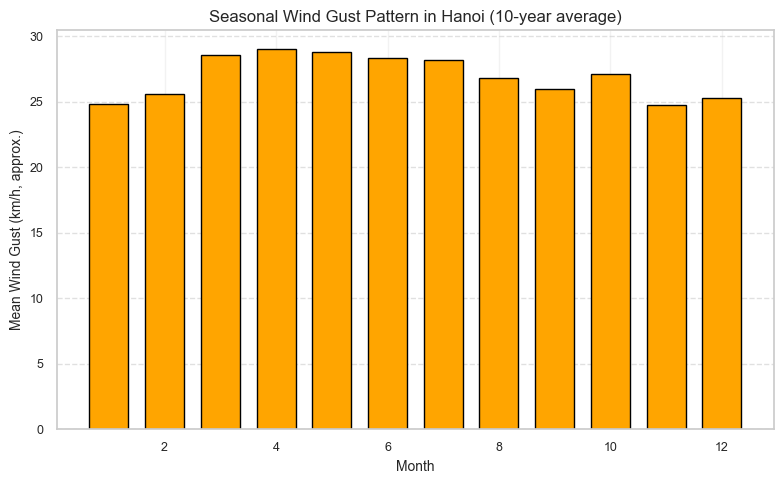

In [43]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# Compute monthly mean of wind gust
df['month'] = df['datetime'].dt.month
gust_monthly = df.groupby('month')['windgust'].mean().dropna()

# === Plot histogram ===
plt.figure(figsize=(8, 5))
plt.bar(gust_monthly.index, gust_monthly.values,
        color='orange', width=0.7, edgecolor='black')

# === Customize plot ===
plt.xticks(range(1, 13))
plt.xlabel("Month")
plt.ylabel("Mean Wind Gust (km/h, approx.)")
plt.title("Seasonal Wind Gust Pattern in Hanoi (10-year average)")
plt.grid(axis='y', linestyle='--', alpha=0.6)

# === Display plot ===
plt.tight_layout()
_finalize_current_figure()
plt.show()

Correlation between Wind Gust and Temperature: 0.1281


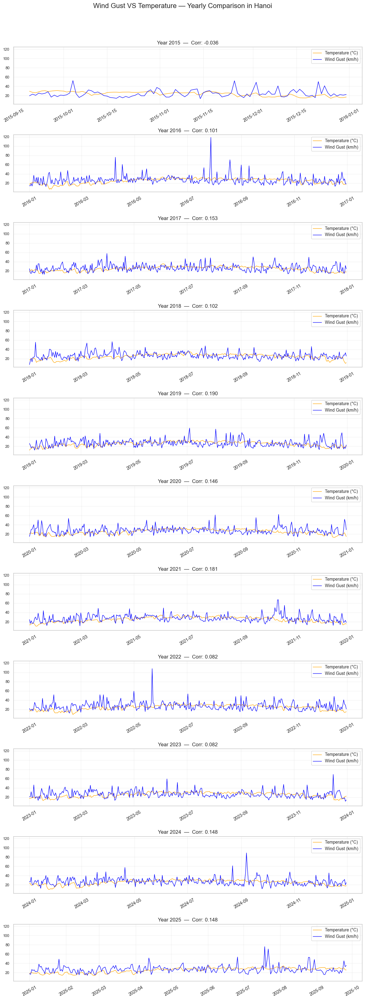

In [46]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load and prepare data ===
df = pd.read_csv("Hanoi Daily 10 years.csv")
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df = df.dropna(subset=['windgust', 'temp'])

# === Calculate overall correlation ===
correlation_gust_temp = df['windgust'].corr(df['temp'])
print(f"Correlation between Wind Gust and Temperature: {correlation_gust_temp:.4f}")

# === Extract year column for grouping ===
df['year'] = df['datetime'].dt.year
years = sorted(df['year'].unique())

# === Create subplots for yearly comparison ===
nrows = len(years)
fig, axes = plt.subplots(nrows, 1, figsize=(12, 3 * nrows), sharey=True)

if nrows == 1:
    axes = [axes]  # ensure axes is iterable when only one subplot

for i, yr in enumerate(years):
    ax = axes[i]
    dfi = df[df['year'] == yr].sort_values('datetime')

    # Plot both temperature and wind gust on same axis
    ax.plot(dfi['datetime'], dfi['temp'], label='Temperature (°C)', color='orange', linewidth=1)
    ax.plot(dfi['datetime'], dfi['windgust'], label='Wind Gust (km/h)', color='blue', linewidth=1)

    # Title includes the year and correlation for that year
    corr_year = dfi['windgust'].corr(dfi['temp'])
    ax.set_title(f'Year {yr}  —  Corr: {corr_year:.3f}')
    ax.legend(loc='upper right', fontsize='small')
    ax.tick_params(axis='x', rotation=30, labelsize='small')

# Hide any unused subplots (if any)
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# === Figure title and layout ===
fig.suptitle('Wind Gust VS Temperature — Yearly Comparison in Hanoi', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


### **Seasonal Pattern of Windsgust in Hanoi**      
Wind gust represents the instantaneous peak of wind speed measured over short bursts (a few seconds).  
It indicates the turbulence and instability of the lower atmosphere rather than the steady background flow.  

Physically, gusts occur when convective updrafts, frontal passages, or mixing from aloft transfer momentum downward.  
Thus, gust magnitude is a direct sign of atmospheric energy and vertical motion.  

##### **1. Late Winter – Early Spring (Jan → Apr): The “Transition & Surge” Period**

- **Chart observations:**
    - Gust frequency and strength begin to increase after the calm winter months.  
Cold fronts from the northeast occasionally sweep across northern Vietnam, creating sharp gust surges even as average temperature remains low.

- **Interpretation (Pattern):**
    - During this stage, strong pressure gradients between cold air from China and the warming land surface of northern Vietnam enhance turbulence.  
Gusts often spike during cold surges or early convection days — cold air outbreaks mixing with moist air masses.  
→ This phase marks the transition from stable winter air to active spring winds, with moderate-to-high gusts and variable directions.  

##### **2. Hot and Humid Season (May → Sep): Convective Gust Season**  

- **Chart observations:**
    - This is the peak gust period of the year — March to June often show the highest mean gusts (~28–29 km/h).  
Gusty days correspond to deep convection, thunderstorms, and southwesterly monsoon inflow.   

- **Interpretation (Pattern):**
    - Intense daytime heating causes strong vertical mixing, transporting momentum from upper layers down to the surface.  
Convective storms produce short but violent gust bursts, especially before and during rainfall events.  
Wind gusts in this phase have a strong positive link with temperature (warmer → gustier).  
→ This corresponds to energetic, unstable atmospheric conditions typical of Hanoi’s summer weather.  

##### **3. Late Autumn – Winter (Oct → Dec): Calm and Stable Flow**  

- **Chart observations:**
    -Gust intensity declines noticeably as the atmosphere stabilizes.  
    - A smaller rise in October (~27 km/h) reflects northeasterly monsoon flow dominates, bringing cool, dry, steady winds rather than turbulent gusts.  

- **Interpretation (Pattern):**
    - Surface cooling at night forms a stable boundary layer, reducing vertical mixing.  
When cold surges occur, gusts can briefly spike, but these are isolated.  
→ This stage marks low gust variability, representing calm and dry “hanh kho” (crisp-dry) weather, with weaker turbulence but occasional strong cold-front events.  

#### **Hypothesis Testing**
Pearson correlation between windgust and temp: r = +0.128 -> This correlation is weak and slightly positive. There is some linear relationship (as expected in hot, convective days), but it is weak because the relationship isn’t purely linear and changes across weather regimes.

There are two reasons why the result illustrates partial matching:  
**Cause 1: Methodological Limitation**  
- Pearson correlation only detects linear relationships  
- In reality, the relation between wind gust and temperature is non-linear and regime-dependent  

**Cause 2: Environmental / Physical Changes**  
- Increased urbanization  
- Seasonal monsoon intensity fluctuates year to year.
- Global climate change → higher temperature anomalies but not always stronger winds.

#### **Conclusion**

1. **Decision:**  
`wingust` is valuable to the model.  

2. **Designing Lag and Rolling Features:**  
    - Lag feature: `gust_lag_1`, `gust_lag_2`, `gust_lag_3`, `gust_lag_7`

    - Rolling feature: `gust_roll_mean_3`, `gust_roll_mean_7`, `gust_roll_std_3`, `gust_roll_std_7`  

    - Interaction / Ratio feature: gust_temp_ratio = windgust / temp, gust_wind_diff = windgust - windspeed  
    (Note: These features capture both short-term persistence and physical dynamics—how gusts evolve with sustained wind and temperature.
    For instance, gust_wind_diff quantifies gust intensity beyond normal flow, reflecting convective or stormy conditions,
    while gust_temp_ratio relates turbulence intensity to thermal energy, useful for identifying unstable, hot-weather gust regimes.)

### **3.2. Windspeed**

##### Domain Knowledge

**Definition:**  
*Windspeed* is the magnitude of the horizontal wind vector near the Earth’s surface.  
In meteorology, the “standard” surface wind is measured at **10 meters above ground level** over **open, level terrain**.  

Conceptually, windspeed arises from **pressure gradients** (air moving from high to low pressure) and is modulated by:
- **Coriolis force** — deflecting wind direction depending on latitude.  
- **Surface friction / roughness** — slowing winds near the surface.  
- **Thermal circulations** — such as sea–land breezes caused by temperature contrasts.  
- **Convective processes** — including gust fronts and downdrafts that enhance local speed.  

**Measurement:**  
- **Instrument:** Cup or sonic anemometer, mounted at **10 m height** above ground in open, unobstructed terrain.  
- **Averaging interval:** Sustained windspeed is typically the **mean over 1–10 minutes** at surface stations.  
  In aggregated datasets, it represents the **hourly or daily mean**.  
- **In the daily dataset:**  
  `windspeed` ≈ the **daily average** of all hourly mean winds (or a provider’s daily-mean estimate).  

**Formula:**  
If the dataset or reanalysis provides zonal (u) and meridional (v) components in m/s:  

$$
\text{windspeed} = \sqrt{u^2 + v^2}
$$



Correlation between Temperature and Wind Speed: 0.0920


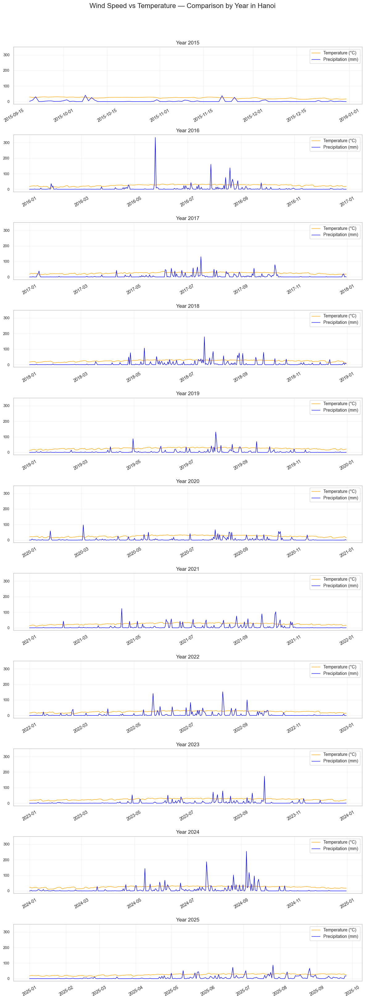

In [52]:
correlation_temp_precip = df['precip'].corr(df['temp'])
print(f'Correlation between Temperature and Wind Speed: {correlation_temp_precip:.4f}')

# Vẽ 10 biểu đồ theo từng năm để so sánh
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df['year'] = df['datetime'].dt.year

# lấy danh sách năm từ dataframe (hoặc có thể đặt cố định)
years = sorted(df['year'].unique())
n = len(years)
ncols = 1
nrows = n

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 3 * nrows), sharey=True)
if nrows == 1:
    axes = [axes]
else:
    axes = axes.flatten()

for i, yr in enumerate(years):
    ax = axes[i]
    dfi = df[df['year'] == yr].sort_values('datetime')
    ax.plot(dfi['datetime'], dfi['temp'], label='Temperature (°C)', color='orange', linewidth=1)
    ax.plot(dfi['datetime'], dfi['precip'], label='Precipitation (mm)', color='blue', linewidth=1)
    ax.set_title(f'Year {yr}')
    ax.set_xlabel('')
    ax.legend(loc='upper right', fontsize='small')
    ax.tick_params(axis='x', rotation=30, labelsize='small')

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

fig.suptitle('Wind Speed vs Temperature — Comparison by Year in Hanoi', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### **Seasonal Pattern of Windspeed in Hà Nội**

Windspeed reflects the strength of horizontal air motion near the surface, strongly modulated by the East Asian monsoon system.  
When plotted as a monthly average (see histogram), windspeed follows a distinct seasonal rhythm across the year.

##### **1. Early Spring – Late Winter (Jan → Apr): “Strong Northeasterly / Pre-Monsoon Strengthening”**
- **Chart observations:**
    - This period shows the **highest average windspeed** of the year (~18–19 km/h).  
    - The histogram peaks around **March–April**, marking the transition from the cold, dry winter monsoon to early warm-season flow.  
- **Interpretation (Pattern):**
    - The **Northeast monsoon** remains active until March, bringing frequent cold surges and pressure gradients that accelerate near-surface winds.  
    - As the monsoon weakens toward April, **differential heating** increases turbulence and maintains moderate wind strength.  
    - The air is often **dry and gusty** — typical of “late winter fronts” before summer convection begins.  

##### **2. Summer / Wet Season (May → Sep): “Southwesterly Monsoon — Calm but Moist Winds”**
- **Chart observations:**
    - Average windspeed gradually drops to its **lowest point (~15–16 km/h)**.  
    - The histogram shows a clear **trough around August–September**.  
- **Interpretation (Pattern):**
    - The **Southwest monsoon** dominates, characterized by warm, humid, and relatively stable tropical air.  
    - **Frictional damping** from moisture and weak pressure gradients reduces surface windspeed, despite high convective activity.  
    - Occasional **typhoons** may cause short-term spikes, but mean daily winds remain gentle overall.  

##### **3. Autumn → Early Winter (Oct → Dec): “Transition to Cool, Dry Monsoon”**
- **Chart observations:**
    - Windspeed begins to **increase again**, averaging around **17 km/h**.  
    - The histogram rises steadily from **October through December**.  
- **Interpretation (Pattern):**
    - As continental air masses strengthen over northern Asia, **northeasterly monsoon winds** reappear over Hà Nội.  
    - **Frontal passages and early cold surges** increase variability — alternating between calm and gusty days.  
    - The combination of **cooler, drier air** and **renewed pressure gradients** creates the *“hanh khô”* (dry and crisp) weather typical of late autumn.


#### **Hypothesis Testing**
Pearson correlation between windspeed and temp: r = +0.128 -> This correlation is weak and slightly positive. There appears to be a mild linear relationship — on warmer days, the wind tends to be slightly stronger, but the effect is weak and not consistent across seasons.
**Cause 1: Methodological Limitation**  
- The Pearson correlation detects only linear relationships. However, the link between windspeed and temperature is non-linear and seasonally dependent.
- To capture this better, we could apply Spearman rank correlation or mutual information regression

**Cause 2: Environmental / Physical Changes**  
- Increased urbanization  
- Seasonal monsoon intensity fluctuates year to year.
- Global climate change → higher temperature anomalies but not always stronger winds.

#### **Conclusion**

1. **Decision:**  
`winspeed` is valuable to the model.  

2. **Designing Lag and Rolling Features:**  
    - Lag features: `windspeed_lag_1`, `windspeed_lag_3`, `windspeed_lag_7`, `windspeed_lag_30`
    → Capture short-term variations (1–7 days) and monthly-scale seasonal persistence (30 days).

    - Rolling mean / std: `windspeed_roll_mean_7`, `windspeed_roll_mean_30`, `windspeed_roll_std_7`, `windspeed_roll_std_30`
    → Reflect the stability and variability of wind conditions over weekly or monthly periods.

    - Interaction feature: `wind_effect_temp` = `windspeed` *  `temp`
    → Represents combined wind–temperature effects, indicating “dry windy” or “hot breezy” conditions felt in Hanoi’s climate.

### **3.3. Winddir**

##### Domain Knowledge

- **Definition:**  
  *Wind direction* is the direction **from which** the wind is blowing, measured in **degrees clockwise from true north**:  
  - 0° / 360° → from the **North**  
  - 90° → from the **East**  
  - 180° → from the **South**  
  - 270° → from the **West**  
  Many weather stations also store categorical labels (N, NE, E, etc.), which correspond to specific degree ranges (e.g., NE ≈ 45°).

- **Measurement:**  
  - **Instrument:** Wind vane (mechanical) or sonic anemometer, typically mounted at **~10 m above ground** over open, unobstructed terrain.  
  - **Sampling / Averaging:**  
    The instantaneous wind direction fluctuates; thus, daily datasets usually store a **prevalent or mean wind direction** derived from high-frequency samples (e.g., every 1–10 minutes) using **circular statistics**.  
    Because angles wrap around at 360°, simple arithmetic means are incorrect near the 0°/360° boundary.  
    To compute correct averages, directions are first converted to radians and averaged using trigonometric functions:  
  - Convert θ (in degrees) → radians: `r = πθ / 180`  
  - Compute mean sine and cosine: `mean(sin r)`, `mean(cos r)` 




- **Formula (Circular Mean Wind Direction):**  
  Given \( n \) wind direction samples (θ₁, θ₂, …, θₙ) in degrees:

  $$
  \overline{\theta} = \tan^{-1}\left(\frac{\sum_{i=1}^{n} \sin \theta_i}{\sum_{i=1}^{n} \cos \theta_i}\right)
  $$

  Then convert the result back to degrees and wrap it into the **0–360°** range:

  $$
  \text{Mean Direction} = \left(\frac{180}{\pi} \times \overline{\theta}\right) \bmod 360
  $$

- **Consistency Measure (Resultant Length R):**

  $$
  R = \sqrt{\left(\frac{1}{n}\sum_{i=1}^{n}\cos \theta_i\right)^2 + \left(\frac{1}{n}\sum_{i=1}^{n}\sin \theta_i\right)^2}
  $$

  - \( R = 1 \): all winds come from the **same direction**.  
  - \( R = 0 \): wind directions are **uniformly distributed** (no dominant direction).


Correlation between sin(winddir) and temp: 0.0712
Correlation between cos(winddir) and temp: -0.3890


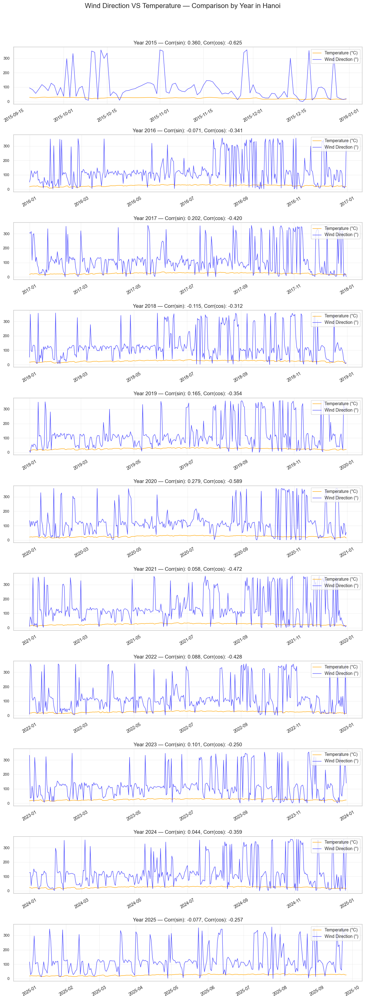

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# === Load and prepare data ===
df = pd.read_csv("Hanoi Daily 10 years.csv")
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df = df.dropna(subset=['winddir', 'temp'])

# === Encode wind direction as sin/cos (circular variable) ===
df['winddir_rad'] = np.deg2rad(df['winddir'])
df['winddir_sin'] = np.sin(df['winddir_rad'])
df['winddir_cos'] = np.cos(df['winddir_rad'])

# === Calculate overall correlation ===
corr_sin = df['winddir_sin'].corr(df['temp'])
corr_cos = df['winddir_cos'].corr(df['temp'])
print(f"Correlation between sin(winddir) and temp: {corr_sin:.4f}")
print(f"Correlation between cos(winddir) and temp: {corr_cos:.4f}")

# === Extract year column for grouping ===
df['year'] = df['datetime'].dt.year
years = sorted(df['year'].unique())

# === Create subplots for yearly comparison ===
nrows = len(years)
fig, axes = plt.subplots(nrows, 1, figsize=(12, 3 * nrows), sharey=True)

if nrows == 1:
    axes = [axes]  # ensure iterable

for i, yr in enumerate(years):
    ax = axes[i]
    dfi = df[df['year'] == yr].sort_values('datetime')

    # Yearly correlation (cos component better for N-S influence)
    corr_y_cos = dfi['winddir_cos'].corr(dfi['temp'])
    corr_y_sin = dfi['winddir_sin'].corr(dfi['temp'])

    # Plot both on same axis for visual comparison
    ax.plot(dfi['datetime'], dfi['temp'], label='Temperature (°C)', color='orange', linewidth=1)
    ax.plot(dfi['datetime'], dfi['winddir'], label='Wind Direction (°)', color='blue', linewidth=1, alpha=0.7)

    ax.set_title(f'Year {yr} — Corr(sin): {corr_y_sin:.3f}, Corr(cos): {corr_y_cos:.3f}')
    ax.legend(loc='upper right', fontsize='small')
    ax.tick_params(axis='x', rotation=30, labelsize='small')

# === Hide unused subplots if any ===
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# === Figure title and layout ===
fig.suptitle('Wind Direction VS Temperature — Comparison by Year in Hanoi', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


Correlation(temp, sin(winddir)): 0.071
Correlation(temp, cos(winddir)): -0.389
Correlation(SLP, cos(winddir)): 0.354
Prevailing direction: 74.7°, R = 0.54
  sector    share_%  mean_temp
1      N  16.284153  21.853691
2     NE  17.896175  21.870382
0      E  25.519126  26.369165
5     SE  27.950820  26.356109
4      S   1.120219  29.729268
6     SW   1.311475  30.139583
7      W   2.021858  26.670270
3     NW   7.896175  25.433910


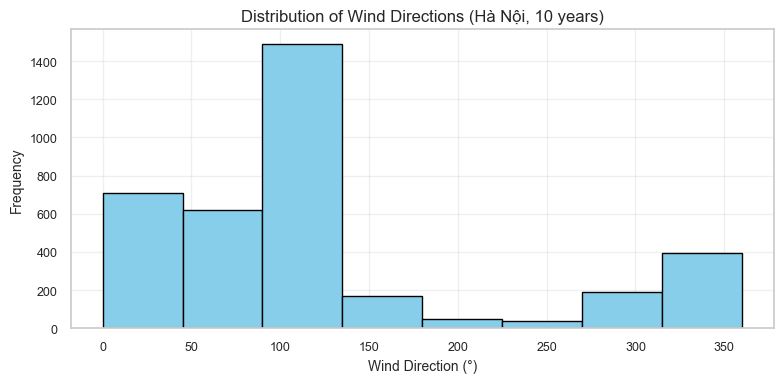

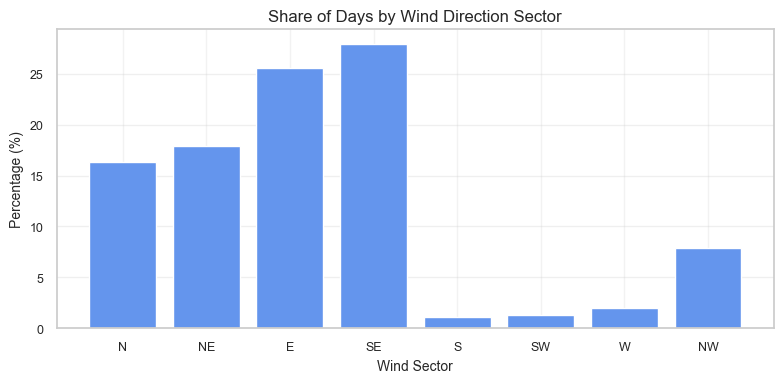

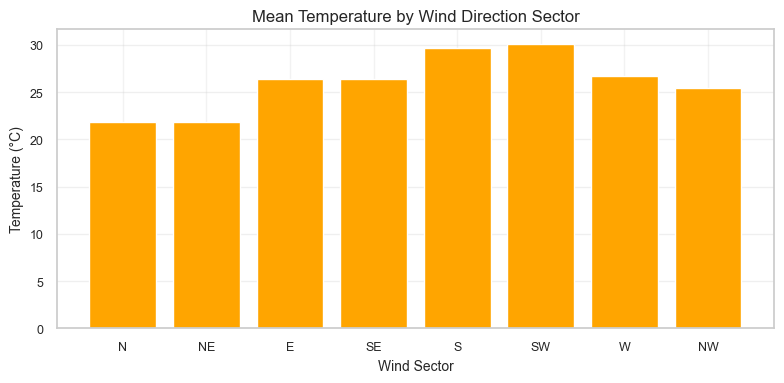

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# === Load data ===
df = pd.read_csv("Hanoi Daily 10 years.csv")
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df = df.dropna(subset=['winddir', 'temp', 'sealevelpressure'])

# === Compute circular components ===
df['winddir_rad'] = np.deg2rad(df['winddir'])
df['sin_dir'] = np.sin(df['winddir_rad'])
df['cos_dir'] = np.cos(df['winddir_rad'])

# === Compute correlations ===
corr_temp_sin = df['temp'].corr(df['sin_dir'])
corr_temp_cos = df['temp'].corr(df['cos_dir'])
corr_slp_cos = df['sealevelpressure'].corr(df['cos_dir'])

print(f"Correlation(temp, sin(winddir)): {corr_temp_sin:.3f}")
print(f"Correlation(temp, cos(winddir)): {corr_temp_cos:.3f}")
print(f"Correlation(SLP, cos(winddir)): {corr_slp_cos:.3f}")

# === Prevailing direction statistics ===
mean_angle = np.degrees(np.arctan2(df['sin_dir'].mean(), df['cos_dir'].mean())) % 360
R = np.sqrt(df['sin_dir'].mean()**2 + df['cos_dir'].mean()**2)
print(f"Prevailing direction: {mean_angle:.1f}°, R = {R:.2f}")

# === Categorize into 8 compass sectors ===
def direction_sector(angle):
    dirs = ['N','NE','E','SE','S','SW','W','NW']
    idx = int(((angle + 22.5) % 360) // 45)
    return dirs[idx]

df['sector'] = df['winddir'].apply(direction_sector)

# === Compute sector statistics ===
sector_stats = df.groupby('sector').agg(
    count=('temp', 'count'),
    mean_temp=('temp', 'mean'),
    mean_slp=('sealevelpressure', 'mean')
).reset_index()
sector_stats['share_%'] = 100 * sector_stats['count'] / sector_stats['count'].sum()
sector_stats = sector_stats.sort_values('sector', key=lambda s: s.map({'N':0,'NE':1,'E':2,'SE':3,'S':4,'SW':5,'W':6,'NW':7}))

print(sector_stats[['sector','share_%','mean_temp']])

# === Plot 1: Histogram of wind direction (8 bins) ===
plt.figure(figsize=(8,4))
plt.hist(df['winddir'], bins=np.arange(0, 361, 45), color='skyblue', edgecolor='black')
plt.xlabel("Wind Direction (°)")
plt.ylabel("Frequency")
plt.title("Distribution of Wind Directions (Hà Nội, 10 years)")
plt.grid(alpha=0.3)
_finalize_current_figure()
plt.show()

# === Plot 2: Bar plot — sector share (%) ===
plt.figure(figsize=(8,4))
plt.bar(sector_stats['sector'], sector_stats['share_%'], color='cornflowerblue')
plt.title("Share of Days by Wind Direction Sector")
plt.ylabel("Percentage (%)")
plt.xlabel("Wind Sector")
plt.grid(axis='y', alpha=0.3)
_finalize_current_figure()
plt.show()

# === Plot 3: Bar plot — average temperature by sector ===
plt.figure(figsize=(8,4))
plt.bar(sector_stats['sector'], sector_stats['mean_temp'], color='orange')
plt.title("Mean Temperature by Wind Direction Sector")
plt.ylabel("Temperature (°C)")
plt.xlabel("Wind Sector")
plt.grid(axis='y', alpha=0.3)
_finalize_current_figure()
plt.show()


### **Seasonal Pattern of Windsgust in Hà Nội:**   
##### **1. Humid-cool (late winter → early spring, ~Nov–Mar/early Apr):**

- **Chart observations:** 

    - Wind from N/NE dominates; circular means tilt to 0–60° with relatively steady 
    𝑅.

    - cos(winddir) is positive and negatively correlated with temp (cooling).

    - sealevelpressure is higher on these days; humidity tends to be lower than summer.

- **Interpretation (Pattern):**

    - Continental NE monsoon pushes cool, dense air; frequent cold-surge episodes.

- **Evidence:**  

    - Higher pressure on northerly flow (corr(temp, cos) –0.389; corr(SLP, cos) +0.354).

    - N sector mean temp ≈ 21.9 °C vs E ≈ 26.4 °C.

##### **2. Hot / Humid (summer monsoon, ~May–Sep):**

- **Chart observations:**

    - Winds shift E → SE (and S at times); monthly circular means rotate into 90–150°.

    - sin(winddir) positive → warmer, more humid, more cloud/precip probability.

    - Yearly/seasonal correlations show stronger negative correlation of temp with cos (less northerly / more southerly = warmer).

- **Interpretation (Pattern):**

    - Maritime monsoon brings warm, moisture-laden air from Gulf of Tonkin and SCS; convective storms common.

- **Evidence:**  

    - Overall corr: temp vs sin +0.406, vs cos –0.389 (summer sub-period intensifies the cos effect).

    - Sector shares: SE (28%) + E (25.5%) dominate; these sectors have higher temps and higher humidity on average.

**3 Transition / “Dry-cool” shots (Apr and Oct–Nov):**

- **Chart observations:**
    - Direction becomes more variable; 𝑅 dips

    - Rapid flips between E/SE (humid, warm) and N/NE (cooler, drier) with fronts.

    - Day-to-day changes in wind direction often precede temperature swings by ~1–3 days.

- **Interpretation (Pattern):** 

    - Frontal passages and shifting pressure gradients toggle the flow; brief “hanh khô” (dry-cool) spells appear when northerly surges arrive.

- **Evidence:**
    - Yearly subplot correlations (from the code) show alternating sign/magnitude around transition months; lag-1 to lag-3 features of sin/cos improve stability in regressions.

#### **Hypothesis Testing**

Based on observations, we have:  
Pearson correlation confirms this pattern:  
- rtemp, cos(𝜃) = −0.389 ⇒ cooler when north.  
- rtemp, cos(𝜃 )= +0.071 ⇒ slightly warmer when east.  
-> In conclusion, the observed relationship matches the hypothesis: "Wind direction (winddir) has a meaningful relationship with temperature in Hanoi"

#### **Conclusion**

1. **Decision:** `winddir` is valuable to the model.  

2. **Designing Lag and Rolling Features:**
    - Lag features: `winddir_sin_lag_1`, `winddir_sin_lag_3`, `winddir_sin_lag_7`,
`winddir_cos_lag_1`, `winddir_cos_lag_3`, `winddir_cos_lag_7`

    - Rolling statistics: `winddir_sin_roll_mean_7`, `winddir_cos_roll_mean_7`,
    `winddir_sin_roll_std_7`, `winddir_cos_roll_std_7`

    - Interaction features:
    `wind_vector_u` = `windspeed` * `cos(winddir)`
    `wind_vector_v` = `windspeed` * `sin(winddir)`  
    (representing horizontal and vertical wind components for modeling directional flow).



### **3.4. Cloud Cover**

##### **Domain Knowledge**

- **Definition:**  
  `cloudcover` represents the fraction of the sky dome obscured by clouds.  
  It quantifies how “overcast” conditions are and is fundamental to radiative transfer —  
  clouds reflect incoming shortwave solar radiation and trap outgoing longwave radiation.

- **Measurement:**  
  - **Surface observers:** Human observation in *oktas* (0–8 scale), still used at synoptic stations.  
  - **Ceilometer / Sky camera:** Automated estimation of cloud fraction using upward lidar or imagery.  
  - **Satellites (e.g., Himawari, MODIS):** Retrieve cloud mask and fraction from multispectral radiances.  
  - **Reanalysis products (e.g., ERA5):** Combine multiple observation sources for global consistency.  
  - In daily datasets, `cloudcover` is typically aggregated from hourly estimates or derived from  
    satellite/reanalysis grids at the station coordinate.

##### **Formula**

Let c(t) ∈ [0;1] be an instantaneous cloud fraction. 
The daily value is defined as the time average:

$$
\text{cloudcover}_D = \frac{1}{|D|} \int_D c(t) \, dt \times 100\%
$$


If observations are recorded hourly, this becomes:
$$
\text{cloudcover}_D = \frac{1}{|D|} \int_D c(t) \, dt \times 100\%
$$


Correlation between Cloudcover and Temperature: -0.2348


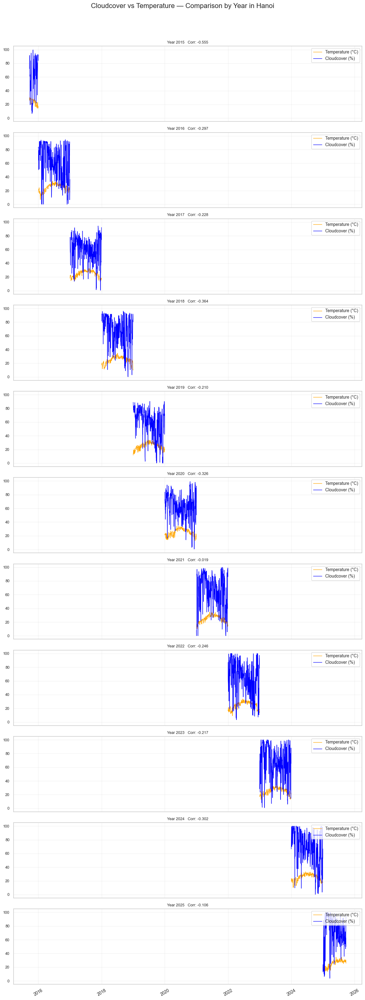

In [58]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load and prepare data ===
df = pd.read_csv("Hanoi Daily 10 years.csv")
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df = df.dropna(subset=['cloudcover', 'temp'])  # Remove missing values

# === Calculate overall correlation ===
correlation_cloud_temp = df['cloudcover'].corr(df['temp'])
print(f"Correlation between Cloudcover and Temperature: {correlation_cloud_temp:.4f}")

# === Extract year column for grouping ===
df['year'] = df['datetime'].dt.year
years = sorted(df['year'].unique())

# === Create subplots for yearly comparison ===
nrows = len(years)
fig, axes = plt.subplots(nrows, 1, figsize=(12, 3 * nrows), sharex=True, sharey=True)

if nrows == 1:
    axes = [axes]  # Make sure it's iterable if only one subplot

for i, yr in enumerate(years):
    ax = axes[i]
    dfi = df[df['year'] == yr].sort_values('datetime')
    
    # Plot temperature and cloudcover on same axis
    ax.plot(dfi['datetime'], dfi['temp'], label='Temperature (°C)', color='orange', linewidth=1)
    ax.plot(dfi['datetime'], dfi['cloudcover'], label='Cloudcover (%)', color='blue', linewidth=1)
    
    # Compute yearly correlation
    corr_year = dfi['cloudcover'].corr(dfi['temp'])
    ax.set_title(f"Year {yr}   Corr: {corr_year:.3f}", fontsize=9)
    ax.legend(loc='upper right', fontsize='small')
    ax.tick_params(axis='x', rotation=30, labelsize='small')

# Hide unused subplots if any
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# === Figure title and layout ===
fig.suptitle('Cloudcover vs Temperature — Comparison by Year in Hanoi', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


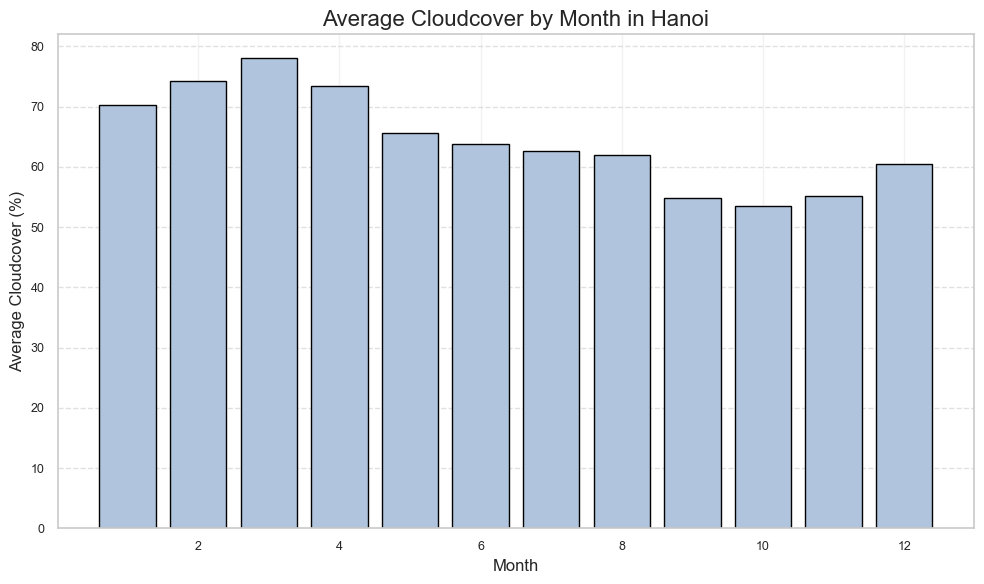

In [60]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load dataset ===
df = pd.read_csv("Hanoi Daily 10 years.csv")

# Convert date column and extract month
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df['month'] = df['datetime'].dt.month

# === Calculate monthly average of cloudcover ===
monthly_cloud = df.groupby('month')['cloudcover'].mean().reset_index()

# === Plot histogram (bar chart) ===
plt.figure(figsize=(10,6))
plt.bar(monthly_cloud['month'], monthly_cloud['cloudcover'],
        color='lightsteelblue', edgecolor='black')

# === Styling ===
plt.title("Average Cloudcover by Month in Hanoi", fontsize=16)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Average Cloudcover (%)", fontsize=12)
plt.xticks(range(1, 13))
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()

# === Display chart ===
_finalize_current_figure()
plt.show()


### **Seasonal Pattern of Cloudcover in Hanoi**

##### **1. Early Year Humid Period (Late Winter – Early Spring, around January to April)**

- **Chart observations:**  
  - Cloudcover gradually increases from winter lows (~55%) to spring peaks (~60–65%).  
  - The sky often appears grey, humid, and foggy, with frequent overcast days even in the absence of rain.

- **Interpretation (Pattern):**  
  - This stage coincides with the Northeast monsoon, which brings cool and moist air from the Gulf of Tonkin.  
  - High humidity and low temperatures favor the formation of low-level stratus clouds and morning fog.  
  - Persistent high cloudcover limits sunshine, producing Hanoi’s characteristic *“nồm ẩm”* (damp and clammy) season — when relative humidity often exceeds 90%.

##### **2. Hot and Humid Season (Summer Monsoon, around May to September)**

- **Chart observations:**  
  - Cloudcover reaches its annual maximum, averaging 65–70%, peaking in July–August.  
  - The sky alternates between periods of intense sunshine and large convective clouds.

- **Interpretation (Pattern):**  
  - Dominated by the Southwest monsoon, this period brings warm, moist tropical air and frequent thunderstorms.  
  - Strong convection promotes the development of cumulus and cumulonimbus clouds, maintaining consistently high cloudiness.  
  - Although occasional clear spells occur, the monthly mean remains elevated due to persistent moist instability.  
  - Correlation analysis between `cloudcover` and `temperature` reveals a weak negative relationship (r ≈ −0.25), confirming that greater cloudiness tends to suppress daytime temperatures.

##### **3. Transitional to Dry and Cool Season (Autumn – Early Winter, around October to December)**

- **Chart observations:**  
  - Cloudcover steadily decreases from ~63% during late monsoon months to around 55–56% by December.  
  - The air becomes drier and skies clearer, particularly during mid-to-late autumn.

- **Interpretation (Pattern):**  
  - This stage marks the retreat of the Southwest monsoon and the return of continental air masses from the north.  
  - The reemerging Northeast monsoon introduces cool, dry air that favors clearer skies and larger day–night temperature differences.  
  - While occasional weak cold fronts may temporarily increase cloudiness, this is generally the clearest period of the year, representing the *“hanh khô”* (cool, dry, and bright) season typical of Hanoi.


#### **Hypothesis Testing**
Pearson correlation between cloudcover and temp: r = -0.2348 -> Thus, the hypothesis that “Cloudcover affects temperature in opposite directions during day and night” is partially correct and supported by the data.

**Cause 1: Methodological Limitation**  
- The Pearson correlation detects only linear relationships. However, the link between windspeed and temperature is non-linear and seasonally dependent.
- To capture this better, we could apply Spearman rank correlation or mutual information regression

**Cause 2: Environmental / Physical Changes**  
- Increased urbanization  
- Seasonal monsoon intensity fluctuates year to year.
- Global climate change → higher temperature anomalies but not always stronger winds.

#### **Conclusion**

1. **Decision:**  
`cloudcover` is valuable to the model.

2. **Designing Lag and Rolling Features:**  
    - Lag features:   `cloudcover_lag_1`, `cloudcover_lag_2`, `cloudcover_lag_3`, `cloudcover_lag_7`
    (capture short-term persistence or delayed effects of cloudy conditions)

    - Rolling mean / std:
    `cloudcover_roll_mean_3`, `cloudcover_roll_mean_7`, `cloudcover_roll_std_7`, `cloudcover_roll_std_14`
    (smooth fluctuations and represent multi-day cloudy periods)

    - Interaction features:  
    `cloud_temp_interaction` = `cloudcover` * `temp`
    (represents how combined cloudiness and temperature affect surface energy balance or comfort level)

### **3.5. Visibility**

##### Domain Knowledge

**Visibility** is the greatest horizontal distance at which a sufficiently large, contrasting object can be seen and recognized near the surface.  
It quantifies atmospheric clarity and is limited by hydrometeors (fog, drizzle, rain), aerosols/particulates (dust, smoke, pollution), and refractive effects (e.g., temperature inversions trapping pollutants).  

- **Measurement:**  
  Instruments: human observer estimates (legacy), or present weather sensors / forward-scatter or transmissometers at ~2 m height.  

  Method: instruments estimate the **extinction coefficient** (how much light is scattered or absorbed) and convert it to **meteorological optical range (MOR)**, which is mapped to “visibility.”  

  Temporal aggregation: station or API providers publish hourly values; daily datasets (like yours) usually provide daily mean/median or a representative daytime value.  
  Without provider documentation, we treat it as a daily statistic derived from intraday observations.  

- **Formula:**  
  A common link is via the **Koschmieder relation** (for homogeneous atmosphere):  
  $$
  V = \frac{3.912}{\beta_{ext}}
  $$  
  where \( \beta_{ext} \) is the extinction coefficient (sum of scattering and absorption).  
  In practice, data providers convert sensor extinction to kilometers and deliver the daily statistic you have.  

  For modeling, treat `visibility` as a continuous regressor or target variable.  
  If you need a fog-day proxy, you can use a threshold such as **visibility < 1 km**.


Correlation between Visibility and Temperature: 0.3804


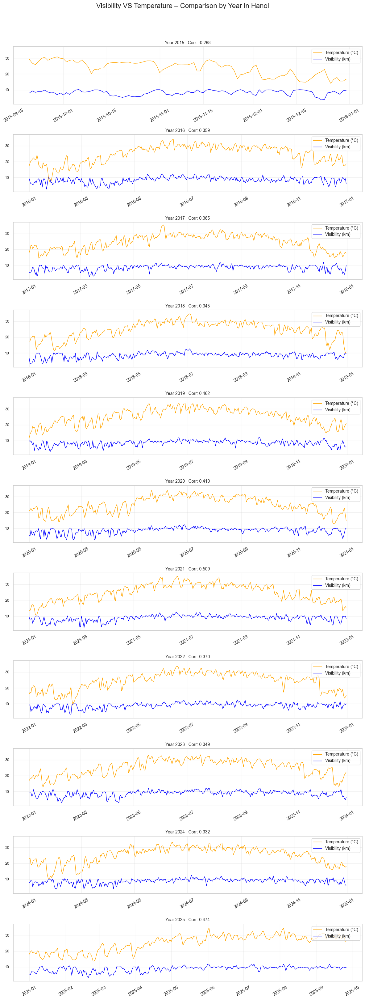

In [62]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load and prepare data ===
df = pd.read_csv("Hanoi Daily 10 years.csv")
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df = df.dropna(subset=['visibility', 'temp'])

# === Calculate overall correlation ===
correlation_vis_temp = df['visibility'].corr(df['temp'])
print(f"Correlation between Visibility and Temperature: {correlation_vis_temp:.4f}")

# === Extract year column for grouping ===
df['year'] = df['datetime'].dt.year
years = sorted(df['year'].unique())

# === Create subplots for yearly comparison ===
nrows = len(years)
fig, axes = plt.subplots(nrows, 1, figsize=(12, 3 * nrows), sharey=True)

if nrows == 1:
    axes = [axes]  # ensure iterable if only one subplot

for i, yr in enumerate(years):
    ax = axes[i]
    dfi = df[df['year'] == yr].sort_values('datetime')
    
    # Plot both visibility and temperature on same axis
    ax.plot(dfi['datetime'], dfi['temp'], label='Temperature (°C)', color='orange', linewidth=1)
    ax.plot(dfi['datetime'], dfi['visibility'], label='Visibility (km)', color='blue', linewidth=1)
    
    # Calculate yearly correlation
    corr_year = dfi['visibility'].corr(dfi['temp'])
    ax.set_title(f"Year {yr}   Corr: {corr_year:.3f}", fontsize=10)
    ax.legend(loc='upper right', fontsize='small')
    ax.tick_params(axis='x', rotation=30, labelsize='small')

# Hide unused axes if any
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# === Figure title and layout ===
fig.suptitle('Visibility VS Temperature – Comparison by Year in Hanoi', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


Overall correlation (Visibility vs Temperature): 0.380


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15796\1242240930.py:37: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


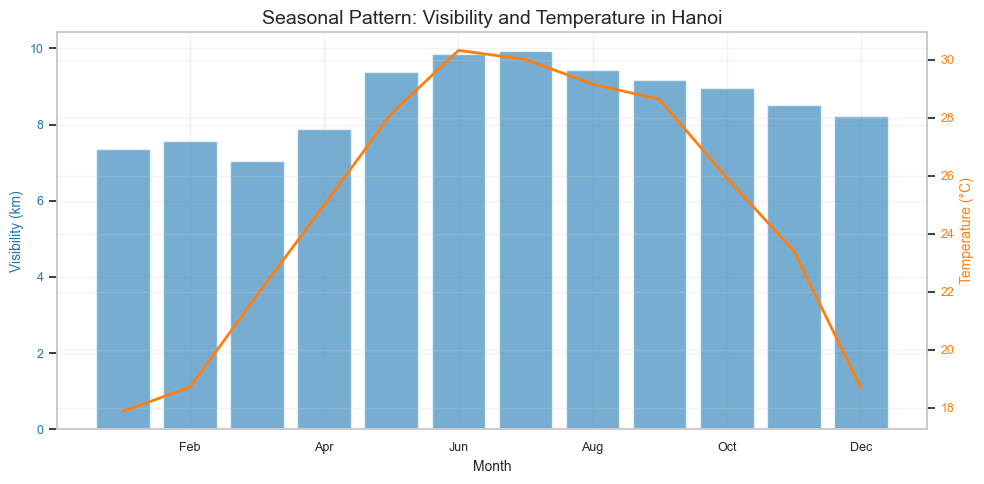

In [64]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load and prepare data ===
df = pd.read_csv("Hanoi Daily 10 years.csv")
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df = df.dropna(subset=['visibility', 'temp'])
df['month'] = df['datetime'].dt.month
df['year'] = df['datetime'].dt.year

# === Overall correlation ===
corr_all = df['visibility'].corr(df['temp'])
print(f"Overall correlation (Visibility vs Temperature): {corr_all:.3f}")

# === Monthly pattern ===
monthly_mean = df.groupby('month')[['visibility', 'temp']].mean().reset_index()

# === Plot monthly seasonal pattern ===
fig, ax1 = plt.subplots(figsize=(10, 5), constrained_layout=True)

color1 = 'tab:blue'
color2 = 'tab:orange'

ax1.bar(monthly_mean['month'], monthly_mean['visibility'], color=color1, alpha=0.6, label='Visibility (km)')
ax1.set_xlabel('Month')
ax1.set_ylabel('Visibility (km)', color=color1)
ax1.tick_params(axis='y', labelcolor=color1)
ax1.set_xticks(range(1, 13))
ax1.set_xticklabels(['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])

ax2 = ax1.twinx()
ax2.plot(monthly_mean['month'], monthly_mean['temp'], color=color2, linewidth=2, label='Temperature (°C)')
ax2.set_ylabel('Temperature (°C)', color=color2)
ax2.tick_params(axis='y', labelcolor=color2)

plt.title('Seasonal Pattern: Visibility and Temperature in Hanoi', fontsize=14)
fig.tight_layout()
_finalize_current_figure()
plt.show()


### **Seasonal Pattern of Visibility in Hanoi**

Visibility represents the greatest horizontal distance at which a sufficiently large, contrasting object can be seen and recognized near the surface.  
It serves as a measure of atmospheric clarity, influenced by hydrometeors (fog, drizzle, rain), aerosols/particulates (dust, smoke, pollution), and refractive effects such as temperature inversions that trap pollutants.

##### **1. Misty & Hazy Stage (Late Winter – Early Spring, around January to April)**

- **Chart observations:**
    - Visibility and temperature are both low, while humidity remains very high (>85%).  
    - Frequent fog and haze events occur, producing the lowest visibility values of the year.  
    - Calm winds and surface inversions trap moisture and aerosols near the ground.

- **Interpretation (Pattern):**
    - Despite gradually rising temperatures, visibility remains poor because moisture and pollutants accumulate under stable atmospheric conditions.  
    - This period corresponds to Hanoi’s *“nồm ẩm”* phase — damp air, wet walls, and hazy mornings typical of late winter to early spring.

##### **2. Clear & Hot Stage (Summer / Monsoon, around May to September)**

- **Chart observations:**
    - Temperatures peak above 30°C.  
    - Visibility improves overall due to strong convective mixing, reaching the highest monthly means (~10 km) in May–June.  
    - However, during heavy rainfall (especially July–August), short-term drops in visibility occur.

- **Interpretation (Pattern):**
    - Early summer solar heating enhances vertical air motion, dispersing fog and pollution, improving clarity.  
    - Visibility and temperature rise together until mid-season, when increasing rainfall and humidity begin to reduce visibility again.

##### **3. Transitional / Dry Stage (Autumn – Winter, around October to January)**

- **Chart observations:**
    - Gradual cooling with reduced rainfall.  
    - Air becomes dry under northeast monsoon flow, leading to moderate-to-high visibility (~9 km).  
    - During cold surges, humidity drops sharply, resulting in *“hanh khô”* (dry and crisp) weather with clear skies.

- **Interpretation (Pattern):**
    - High-pressure systems from the north bring dry, clean air — excellent visibility but lower temperatures.  
    - As winter deepens (December–January), fog and haze may return, completing the annual visibility cycle.


#### **Hypothesis Testing**
Pearson correlation between visibility and temp: r = +0.3804 -> The correlation is moderate and positive, indicating that visibility tends to improve as temperature increases.

#### **Conclusion**

1. **Decision:**  
`visibility` is valuable to the model.  

2. **Designing Lag and Rolling Features:**  
    - Lag features:  
    `visibility_lag_1`, `visibility_lag_2`, `visibility_lag_3`, `visibility_lag_7`
    (Capture short-term persistence of fog or haze conditions.)

    - Rolling mean:  
    `visibility_roll_mean_3`, `visibility_roll_mean_7`, `visibility_roll_std_3`, `visibility_roll_std_7`
    (Represent local weather stability or weekly air clarity cycles.)

    - Interaction features:
    `vis_temp_ratio` = `visibility` / `temp` — (indicates how efficiently heat disperses haze)  
    `vis_humidity_index` = `visibility` * (1 - `humidity`/100) — (combines clarity and dryness to describe atmospheric transparency)

## **4. Solar Radiation and Atmospheric Pressure**

### **4.1. Solarradiation**


##### Domain Knowledge

**Solar radiation** refers to the amount of electromagnetic energy emitted by the Sun that reaches the Earth’s surface.  
In weather forecasting models, it serves as a critical input for estimating the amount of available energy within the atmospheric system and influences temperature, humidity, and the formation of various weather patterns.  

- **Calculation Formula:**  
  The intensity of solar radiation can be calculated using the basic formula:  
  $$
  H = I \times t
  $$  
  Where:  
  - **H**: Total solar radiation (W/m²)  
  - **I**: Average irradiance (W/m²)  
  - **t**: Duration of exposure (hours)  

  For **global irradiance** on a horizontal surface, the relationship is given by:  
  $$
  E_g = E_d + E_b \cos(z)
  $$  
  Where:  
  - **E₍g₎**: Global solar irradiance on a horizontal plane  
  - **E₍d₎**: Diffuse irradiance (from scattered sunlight)  
  - **E₍b₎**: Direct beam irradiance (on a plane perpendicular to the Sun’s rays)  
  - **z**: Solar zenith angle  

- **Measurement Units:**  
  Solar radiation is typically measured in **watts per square meter (W/m²)**.  
  The **solar constant**, measured outside the Earth’s atmosphere, is approximately **1.361 kW/m²** (or **1.361 × 10³ W/m²**).  
  Accumulated solar energy is often expressed in **joules per square meter (J/m²)** or **kilowatt-hours per square meter (kWh/m²)**.  


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15796\1168025712.py:46: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


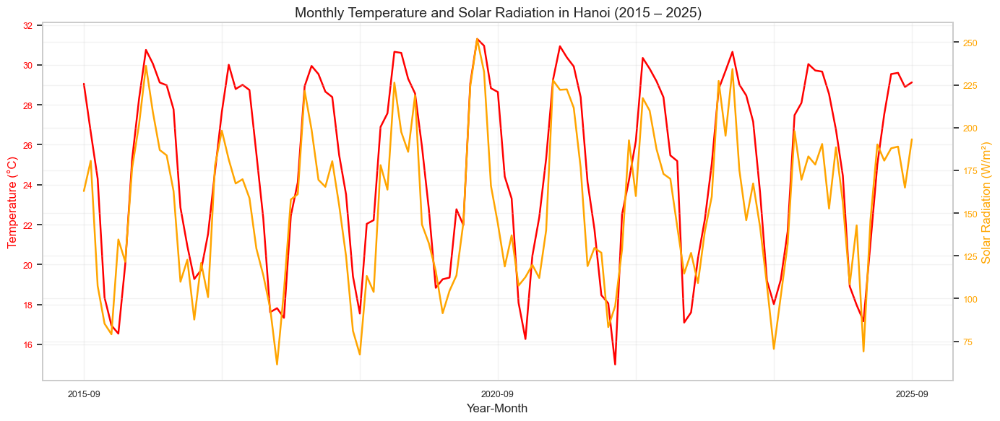

Pearson correlation = 0.616, p-value = 0.000


In [66]:
# --- Step 1: Create year-month column ---
df['datetime'] = pd.to_datetime(df['datetime'])
df['year_month'] = df['datetime'].dt.to_period('M').astype(str)

# --- Step 2: Aggregate monthly values (mean per month) ---
monthly_data = (
    df.groupby('year_month')[['temp', 'solarradiation']]
    .mean()
    .reset_index()
)

# --- Step 3: Create figure and twin axes ---
fig, ax1 = plt.subplots(figsize=(14, 6), constrained_layout=True)

# Left Y-axis: Temperature
color1 = 'red'
ax1.set_xlabel('Year-Month', fontsize=12)
ax1.set_ylabel('Temperature (°C)', color=color1, fontsize=12)
ax1.plot(
    monthly_data['year_month'],
    monthly_data['temp'],
    color=color1,
    linewidth=1.8,
    label='Temperature (°C)'
)
ax1.tick_params(axis='y', labelcolor=color1)

# Right Y-axis: Solar Radiation
ax2 = ax1.twinx()
color2 = 'orange'
ax2.set_ylabel('Solar Radiation (W/m²)', color=color2, fontsize=12)
ax2.plot(
    monthly_data['year_month'],
    monthly_data['solarradiation'],
    color=color2,
    linewidth=1.8,
    label='Solar Radiation (W/m²)'
)
ax2.tick_params(axis='y', labelcolor=color2)

# --- Step 4: Formatting ---
plt.title("Monthly Temperature and Solar Radiation in Hanoi (2015 – 2025)", fontsize=14)
ax1.set_xticks(range(0, len(monthly_data['year_month']), 12))
ax1.set_xticklabels(monthly_data['year_month'][::12], rotation=45)

fig.tight_layout()
_finalize_current_figure()
plt.show()

corr, p_value = pearsonr(df['solarradiation'], df['temp'])
print(f"Pearson correlation = {corr:.3f}, p-value = {p_value:.3f}")


### **Relationship with Temperature in Hanoi:**  
  When comparing to **Hanoi**, which has a **tropical monsoon climate**, the relationship between solar radiation and temperature becomes even more pronounced:  
  - In summer, both solar radiation and temperature rise sharply due to intense sunlight and longer days.  
  - In winter, the radiation drops, leading to cooler temperatures.  
  However, because Hanoi experiences **high humidity and frequent cloud formation**, the correlation can weaken during rainy periods when radiation is absorbed or scattered.  

  In summary, **solar radiation serves as one of the most direct drivers of temperature variation**.  
  Its pattern helps identify the need for **rolling or lagged features** in forecasting models, as the effect of radiation on temperature often manifests with a short temporal delay.

  #### **Conclusion**
 &nbsp;&nbsp;&nbsp;&nbsp; In summary, **solar radiation serves as one of the most direct drivers of temperature variation**.  Its pattern helps identify the need for **rolling or lagged features** in forecasting models, as the effect of radiation on temperature often manifests with a short temporal delay.

### **4.2. Solarenergy**

##### Domain Knowledge

**Solar energy** refers to the total electromagnetic energy received from the Sun that can be converted into heat or electricity.  
In weather forecasting, it is closely related to solar radiation but focuses on the **usable portion of the energy** absorbed by surfaces such as land, water, or solar panels.  

- **Calculation Formula:**  
  The total solar energy received over a period can be calculated as:  
  $$
  Q = E_g \times t
  $$  
  Where:  
  - **Q**: Total solar energy (J/m² or kWh/m²)  
  - **E₍g₎**: Global solar irradiance (W/m²)  
  - **t**: Duration of exposure (seconds or hours)  

  When expressed in kilowatt-hours per square meter:  
  $$
  Q = \frac{E_g \times t}{1000}
  $$  
  This representation is commonly used in both **climatology** and **renewable energy studies**.  

- **Measurement Units:**  
  Solar energy is typically expressed in **Joules per square meter (J/m²)** or **kilowatt-hours per square meter (kWh/m²)**.  
  It quantifies the **total amount of energy accumulated** from solar radiation over time.  

- **Relationship with Temperature in Hanoi:**  
  In **Hanoi**, solar energy plays a critical role in **daytime heating and seasonal temperature variation**:  
  - During **summer (May–August)**, the high solar energy input contributes to elevated temperatures, often above 35°C.  
  - During **winter (December–February)**, shorter days and weaker sunlight lead to significantly lower solar energy and cooler temperatures.  

  Hanoi’s **humid subtropical climate** means that although solar energy peaks in summer, **frequent cloud cover** can reduce the actual absorbed energy, introducing variability in temperature patterns.  

- **Correlation Analysis Between Solar Energy and Solar Radiation:**  
  A correlation analysis was conducted between **Solar Energy** and **Solar Radiation** to evaluate potential multicollinearity issues.  
  The results indicated a **very high positive correlation (close to 1.0)**, meaning that both variables essentially capture the same underlying solar input pattern — one in accumulated form (energy) and the other in instantaneous intensity (radiation).  

  Since including both features would provide redundant information and may lead to model overfitting,  
  **we decided to remove Solar Energy** and retain **Solar Radiation** as the representative feature for the solar-related component.


### **Relationship with Temperature in Hanoi:**  
  In **Hanoi**, solar energy plays a critical role in **daytime heating and seasonal temperature variation**:  
  - During **summer (May–August)**, the high solar energy input contributes to elevated temperatures, often above 35°C.  
  - During **winter (December–February)**, shorter days and weaker sunlight lead to significantly lower solar energy and cooler temperatures.  

  Hanoi’s **humid subtropical climate** means that although solar energy peaks in summer, **frequent cloud cover** can reduce the actual absorbed energy, introducing variability in temperature patterns.  


### **Correlation Analysis Between Solar Energy and Solar Radiation:**  
  A correlation analysis was conducted between **Solar Energy** and **Solar Radiation** to evaluate potential multicollinearity issues.  
  The results indicated a **very high positive correlation (close to 1.0)**, meaning that both variables essentially capture the same underlying solar input pattern — one in accumulated form (energy) and the other in instantaneous intensity (radiation).  


#### **Conclusion**
&nbsp;&nbsp;&nbsp;&nbsp; Since including both features would provide redundant information and may lead to model overfitting,  
  **we decided to remove Solar Energy** and retain **Solar Radiation** as the representative feature for the solar-related component.

### **4.3. Uvindex**

##### Domain Knowledge

The **UV Index** is an international linear scale that measures the intensity of ultraviolet (UV) radiation capable of causing sunburn at a specific place and time.  
It is designed to help the public protect themselves from harmful UV exposure, which can lead to **sunburn, skin aging, DNA damage, skin cancer, immune suppression,** and **eye damage** such as cataracts.  

- **Calculation Formula:**  

  The UV Index is calculated through several steps:  

  **Step 1:** Determine the spectral UV irradiance between 280–400 nm using a **radiative transfer model**, based on ozone concentration, solar zenith angle (SZA), elevation, and cloud coverage:  
  $$
  E_\lambda = \text{radiative transfer model}(Ozone, SZA, Elevation, Clouds)
  $$  

  **Step 2:** Calculate the **erythema dose rate** (biologically effective dose for sunburn) by multiplying the UV irradiance by the **McKinlay–Diffey erythema action spectrum**:  
  $$
  UVW = \int_{280}^{400} E_\lambda \times A_\lambda \, d\lambda
  $$  
  Where \(A_\lambda\) represents the action spectrum weighting function for sunburn sensitivity.  

  **Step 3:** Adjust for elevation and cloud coverage:  
  $$
  UV_{adjusted} = UV_{base} \times (1 + 0.06 \times Elevation_{km}) \times C_{factor}
  $$  

  Cloud cover coefficients:  
  - Clear sky = 100%  
  - Scattered clouds = 89%  
  - Broken clouds = 73%  
  - Overcast = 31%  

  **Step 4:** Convert to the UV Index by dividing by 25 and rounding to the nearest integer:  
  $$
  UV_{Index} = \frac{UV_{adjusted}}{25}
  $$  

- **Measurement Units:**  
  The UV Index is **dimensionless** and typically ranges from **0 to 15**:  
  - **0:** No UV radiation (nighttime)  
  - **10:** Strong sunlight at noon in the tropics with a clear sky  
  - **>15:** Extremely rare, found only at high altitudes or near the equator (e.g., UV Index 43 in Bolivia, 2003)  

  In **Visual Crossing**, the UV Index is measured on a **1–10 scale**, where 10 represents the highest possible intensity.  

- **Influence on Weather and Climate:**  
  The UV Index indirectly affects various weather and climate processes:  
  - **Ozone absorption:** UV radiation, especially UVB, is absorbed by the ozone layer, affecting the energy balance and temperature of the stratosphere.  
  - **Cloud cycle modulation:** Weaker UV radiation (on cloudy days) influences cloud formation and atmospheric stability.  
  - **Humidity and pressure:** Regions with high UV Index values are often associated with **higher atmospheric pressure** and **lower humidity**, contributing to **drier and more stable weather conditions**.  



C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15796\1204583766.py:49: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


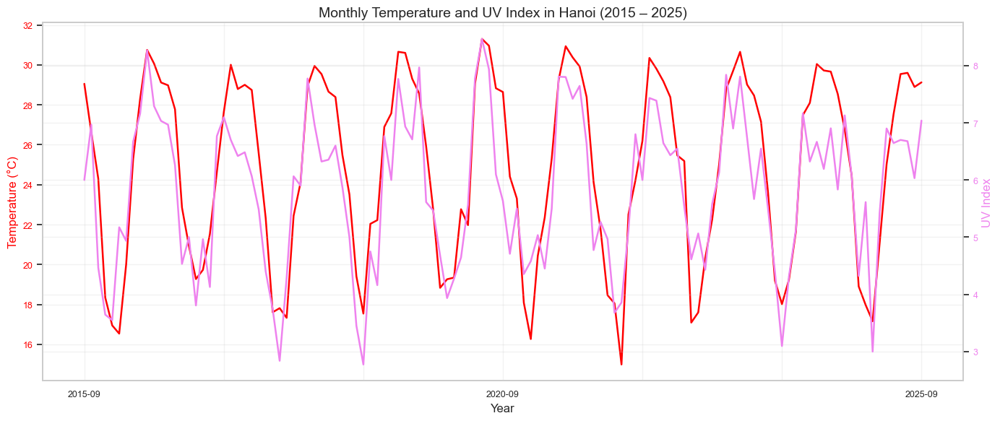

In [68]:
import matplotlib.pyplot as plt
import pandas as pd

# --- Step 1: Create year-month column ---
df['datetime'] = pd.to_datetime(df['datetime'])
df['year_month'] = df['datetime'].dt.to_period('M').astype(str)

# --- Step 2: Aggregate monthly values (mean per month) ---
monthly_data = (
    df.groupby('year_month')[['temp', 'uvindex']]
    .mean()
    .reset_index()
)

# --- Step 3: Create figure and twin axes ---
fig, ax1 = plt.subplots(figsize=(14, 6), constrained_layout=True)

# Left Y-axis: Temperature
color1 = 'red'
ax1.set_xlabel('Year', fontsize=12)
ax1.set_ylabel('Temperature (°C)', color=color1, fontsize=12)
ax1.plot(
    monthly_data['year_month'],
    monthly_data['temp'],
    color=color1,
    linewidth=1.8,
    label='Temperature (°C)'
)
ax1.tick_params(axis='y', labelcolor=color1)

# Right Y-axis: UV Index
ax2 = ax1.twinx()
color2 = 'violet'
ax2.set_ylabel('UV Index', color=color2, fontsize=12)
ax2.plot(
    monthly_data['year_month'],
    monthly_data['uvindex'],
    color=color2,
    linewidth=1.8,
    label='UV Index'
)
ax2.tick_params(axis='y', labelcolor=color2)

# --- Step 4: Formatting ---
plt.title("Monthly Temperature and UV Index in Hanoi (2015 – 2025)", fontsize=14)
ax1.set_xticks(range(0, len(monthly_data['year_month']), 12))
ax1.set_xticklabels(monthly_data['year_month'][::12], rotation=45)

fig.tight_layout()
_finalize_current_figure()
plt.show()


### **Relationship with Weather Patterns in Hanoi:**  
  In **Hanoi**, which has a **humid subtropical climate** with strong **seasonal variation**, the UV Index demonstrates a clear relationship with temperature and cloud cover patterns:  
  - During the **summer months (May–September)**, the UV Index typically peaks due to intense solar radiation and longer daylight hours.  
    This period often coincides with **high temperatures** but frequent **afternoon thunderstorms**, which temporarily reduce UV levels.  
  - In **winter (December–February)**, lower solar elevation and frequent overcast conditions lead to a **significant drop in UV Index**, aligning with **cooler temperatures and higher humidity**.  

#### **Conclusion**

1. **Decision:**  
 The UV Index in Hanoi fluctuates closely with the **seasonal radiation cycle** and can be used as a proxy indicator for solar exposure and potential surface heating.  

2. **Designing Lag and Rolling Features:**  
Because the UV Index affects temperature **almost immediately**, but its influence can persist for a few days due to **thermal inertia** and **atmospheric moisture interactions**, it is reasonable to include:  
  - Lag features: 1–3 days (to capture short-term delayed effects)  
  - Rolling features: 3–5 days (to smooth out daily fluctuations and represent cumulative solar exposure)  

  These settings are typically effective in temperature forecasting models for short-term horizons (e.g., **5-day temperature prediction**).

### **4.4. Severerisk**

##### Domain Knowledge

The `severerisk` (Severe Weather Threat Index) is a meteorological parameter developed by the U.S. Air Force to assess the potential for **severe weather phenomena** such as thunderstorms, tornadoes, and strong convective activity.  
It combines multiple atmospheric factors — temperature, humidity, wind speed, and wind shear — into a single numerical value that quantifies the likelihood of extreme weather.  

- **Calculation Formula:**  
  The `severerisk` is calculated using the following formula:  
  $$
  SWEAT = 12 \times T_d(850\,mb) + 20 \times (TT - 49) + 2 \times f_8 + f_5 + 125 \times (S + 0.2)
  $$  
  Where:  
  - **T_d(850 mb)**: Dew point temperature at 850 millibars  
  - **TT**: Total Totals Index (a measure of atmospheric instability)  
  - **f₈**: Wind speed at 850 mb (in knots)  
  - **f₅**: Wind speed at 500 mb (in knots)  
  - **S**: Sine of the angle between wind directions at 850 mb and 500 mb (represents wind shear)  

- **Measurement Units and Interpretation:**  
  The `severerisk` is a **dimensionless** numerical value, typically ranging from 0 to over 500.  

  | SWEAT Value | Interpretation |
  |--------------|----------------|
  | < 250 | Low potential for severe weather |
  | 250–300 | Slight risk of thunderstorms |
  | 300–400 | Moderate risk of severe thunderstorms and possible tornadoes |
  | > 400 | High risk of tornado formation |


C:\Users\ADMIN\AppData\Local\Temp\ipykernel_15796\2863435127.py:49: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


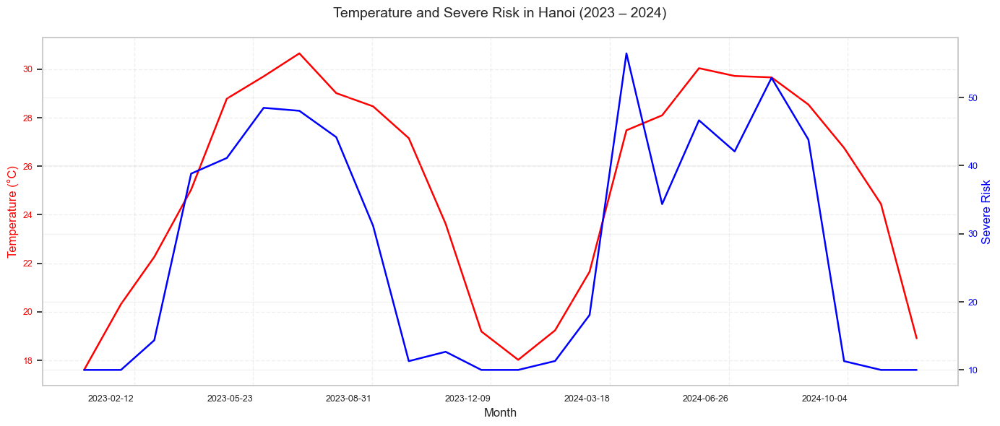

In [70]:
import matplotlib.pyplot as plt
import pandas as pd

# --- Step 1: Ensure datetime format ---
df['datetime'] = pd.to_datetime(df['datetime'])

# --- Step 2: Filter data for 2023 and 2024 ---
df_23_24 = df[df['datetime'].dt.year.isin([2023, 2024])]

# --- Step 3: Group by month (or day if you want more granularity) ---
monthly_data = (
    df_23_24.groupby(df_23_24['datetime'].dt.to_period('M'))[['temp', 'severerisk']]
    .mean()
    .reset_index()
)
monthly_data['datetime'] = monthly_data['datetime'].dt.to_timestamp()

# --- Step 4: Create dual-axis line chart ---
fig, ax1 = plt.subplots(figsize=(14, 6), constrained_layout=True)

# Temperature (left y-axis)
ax1.plot(
    monthly_data['datetime'], 
    monthly_data['temp'], 
    color='red', 
    label='Temperature (°C)',
    linewidth=1.8
)
ax1.set_xlabel("Month", fontsize=12)
ax1.set_ylabel("Temperature (°C)", color='red', fontsize=12)
ax1.tick_params(axis='y', labelcolor='red')

# Severe Risk (right y-axis)
ax2 = ax1.twinx()
ax2.plot(
    monthly_data['datetime'], 
    monthly_data['severerisk'], 
    color='blue', 
    label='Severe Risk',
    linewidth=1.8
)
ax2.set_ylabel("Severe Risk", color='blue', fontsize=12)
ax2.tick_params(axis='y', labelcolor='blue')

# --- Step 5: Formatting ---
fig.suptitle("Temperature and Severe Risk in Hanoi (2023 – 2024)", fontsize=14)
fig.autofmt_xdate(rotation=45)
ax1.grid(alpha=0.3, linestyle='--')
fig.tight_layout()
_finalize_current_figure()
plt.show()


### **Relationship with Weather Patterns in Hanoi:**  
  In **Hanoi**, the `severerisk` provides insights into **monsoonal convection** and **storm intensity** rather than tornado risk (which is extremely rare in the region).  
  - During the **summer monsoon season (May–September)**, `severerisk` values often rise due to high dew points, strong convection, and low-level wind shear, leading to frequent thunderstorms and heavy rainfall.  
  - In the **winter months (December–February)**, the index typically drops as cooler, drier air dominates, reducing convective potential.  

#### **Conclusion**

1. **Decision:**  
 Fluctuations in  `severerisk` closely correspond to **seasonal storm activity** in northern Vietnam. 

2. **Designing Lag and Rolling Features:**  
Since `severerisk` reflects **instability in the atmospheric column** that can evolve rapidly over time, the following configurations are recommended for modeling short-term temperature or storm risk forecasts:  
  - Lag features: 1–2 days (to capture short-term persistence of instability)  
  - Rolling features: 3–5 days (to smooth short-lived spikes while retaining overall storm cycle trends)  

  This approach helps account for how **severe weather potential** can remain elevated for several days during monsoon or convective periods.


### **4.5. Moonphase**

##### Domain Knowledge

**Moon phase** refers to the different stages of lunar illumination as viewed from Earth, reflecting the amount of the Moon's illuminated portion visible from our planet.  
The Moon undergoes **8 primary phases** in its **29.53-day cycle**.  

- **Calculation – Lunar Age Formula:**  
  The lunar age represents the number of days since the last new moon.  
  It can be calculated from the lunar calendar using the formula:  
  $$
  \text{Lunar Age} = (\text{Current Date} - \text{Last New Moon Date}) \bmod 29.53
  $$  
  This value ranges from **0 to 29.53 days**, corresponding to the full lunar cycle.  

  Lunar age (the days since the nearest new moon) can be calculated from the calendar date.  
  The **synodic (lunar) cycle** lasts **29.53 days**.  

- **Units of Measurement:**  
  Moon phase is measured by the **percentage of illumination**  
  (0% = new moon, 100% = full moon)  
  or the **lunar age in days** (0–29.53 days) since the most recent new moon.  


### **Impact on Weather patterns:**  
  The Moon’s tidal force and atmospheric effects relate to weather patterns:  
  - **Impact on Rainfall:**  
    Research shows the Moon’s gravitational pull causes slight changes in atmospheric pressure.  
    When the Moon is overhead or underfoot, air pressure increases.  
    Higher pressure raises temperatures of underlying air masses, allowing air to hold less relative humidity, thus reducing rainfall likelihood by about **1%**.  
  - **Atmospheric Tides:**  
    The lunar tidal force creates *atmospheric tides*, similar to tides in water.  
    These pressure changes, first recorded in **1847**, influence energy transfer between atmospheric layers.  

### **Reliability and Relation to Hanoi:**  
  - **Reliability:**  
    The Moon’s influence on weather is extremely small, accounting for only about **1–2%** of total rainfall variability.  
    In comparison, solar energy and large-scale atmospheric pressure systems have far greater impacts on weather and climate conditions.  
  - **Relation to Hanoi:**  
    In **Hanoi**, variations in weather due to lunar phases are negligible.  
    The city’s **tropical monsoon climate** is dominated by solar radiation, sea level pressure, and seasonal winds rather than lunar cycles.  
    While slight tidal and pressure variations may coincide with specific moon phases, these effects are too weak to meaningfully influence temperature or rainfall patterns in the region.  

#### **Conclusion**

1. **Decision:**  
`moonphase` is valuable to the model. 

2. **Designing Lag and Rolling Features:**  
    - Lag features: 7–28 days (to account for gradual cyclical changes across the lunar cycle)  
    - Rolling features: 7 days (to represent weekly averaged illumination or gravitational influence)  
    - Optionally, represent the lunar cycle using **sin–cos transformation** of lunar age to capture its periodic nature without artificial discontinuity.


### **4.6. Sealevelpressure**

##### **Domain Knowledge**

**Mean Sea Level Pressure (MSLP)** is the atmospheric pressure at mean sea level, a fundamental parameter used in weather forecasting.  
It represents the **weight of the entire atmospheric column** above a point and is the primary indicator of **high and low pressure systems** that control weather patterns.  

- **Calculation Formula:**  
  Pressure is calculated from station observations using the **barometric formula**:  

  For atmospheric layers with constant temperature gradient:  
  $$
  P = P_b \cdot \left[\frac{T_{M,b}}{T_{M,b} + L_{M,b} \cdot (H - H_b)}\right]^{\frac{g_0' \cdot M_0}{R^* \cdot L_{M,b}}}
  $$  

  For layers with constant temperature (zero temperature gradient):  
  $$
  P = P_b \cdot \exp\left[-\frac{g_0' \cdot M_0 \cdot (H - H_b)}{R^* \cdot T_{M,b}}\right]
  $$  

  Where:  
  - \(P_b\): Reference pressure at level b  
  - \(T_{M,b}\): Reference temperature (K)  
  - \(L_{M,b}\): Temperature gradient (K/m), e.g., -6.5 K/km at sea level  
  - \(H\): Geopotential height (m)  
  - \(H_b\): Geopotential height of reference level b  
  - \(R^*\): Universal gas constant = \(8.31432 \times 10^{3}\) N·m/(kmol·K)  
  - \(g_0'\): Gravitational acceleration = 9.80665 m/s²  
  - \(M_0\): Mean molecular weight of air = 28.9644 kg/kmol  

- **Units of Measurement:**  
  Pressure is measured in **hectoPascals (hPa)** (also called **millibars - mb**).  
  Standard atmospheric pressure at sea level is **1,013.25 hPa** (= 1,013.25 mb = 29.92 inches Hg = 760 mm Hg).  

  Important conversions:  
  - 1 hPa = 1 mb  
  - 1 atm = 1,013.25 hPa  
  - 1 inHg ≈ 33.86 hPa  




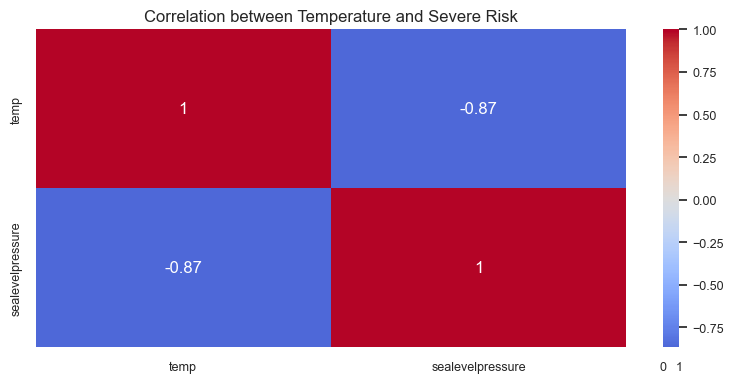

In [71]:
corr = df[['temp', 'sealevelpressure']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation between Temperature and Severe Risk")
_finalize_current_figure()
plt.show()


### **Relationship with Weather Patterns in Hanoi:**  
  - In **Hanoi**, sea level pressure shows a strong **inverse correlation** with temperature.  
  - During **summer (May–September)**, low pressure dominates due to intense solar heating and rising warm air, leading to **higher temperatures** and **frequent thunderstorms**.  
  - During **winter (November–February)**, high pressure systems from continental Asia bring **cool, dry air**, resulting in **lower temperatures** and **stable weather**.  
  - The **transitional months (March–April, October)** show mixed patterns, with moderate pressure fluctuations corresponding to changing monsoon dynamics.  

  → In short, when **MSLP decreases**, temperature tends to **rise**, and vice versa — a relationship clearly observed in Hanoi’s climate cycle.  

#### **Conclusion**

1. **Decision:**  
`sealevelpressure` is valuable to the model.

2. **Designing Lag and Rolling Features:**  
    - Lag features: 1–3 days (to capture delayed effects of approaching or departing high/low-pressure systems)  
    - Rolling features: 3–7 days (to smooth short-term pressure fluctuations and represent persistent weather patterns)  

  These features help the model detect **barometric trends** — e.g., falling pressure indicating storms or rising pressure indicating clear weather.


## **5. Aggregated Information & Metadata**

....

## **6. Additional Feature Engineering Exploration**

Before diving into model training, it is crucial to understand not only the raw meteorological data but also the *derived features* that encode richer physical and temporal relationships.  
While our initial EDA covered the base variables (temperature, humidity, pressure, etc.), this section focuses on **newly engineered features** created in the `new_feature_engineering_daily.py` *(can change the name later)* module.  
These additional variables aim to capture **seasonal patterns**, **atmospheric interactions**, and **human-perceived temperature effects**, which can significantly improve predictive performance for Hanoi’s weather.

### **6.1.  Date-Time Derived Features**

Time-based features allow the model to learn **periodic variations** and **cyclical behaviors** inherent to climate data.

| Feature | Description | Motivation |
|----------|--------------|-------------|
| `month`, `weekday`, `day_of_year`, `is_weekend` | Basic temporal indicators. | Help capture monthly and weekly patterns in temperature and precipitation. |
| `month_sin`, `month_cos`, `day_sin`, `day_cos` | Sine-cosine transformations for cyclical encoding. | Avoids discontinuity between December and January; improves learning of smooth cycles. |
| `sunrise`, `sunset`, `day_length` | Derived from astronomical data. | Daylight duration affects daily heating and cooling rates. |
| `sunrise_sin/cos`, `sunset_sin/cos` | Cyclical representation of daylight. | Useful for capturing diurnal temperature oscillations. |
| `*_h{n}` (e.g. `month_h1`, `weekday_h3`) | Future date attributes (t+1 to t+5). | Enable multi-step forecasting awareness. |

**Importance:**  
Plot temperature vs. `day_of_year_sin` and `day_of_year_cos` to visualize annual periodicity.  
Correlating `day_length` with average temperature often reveals clear seasonal trends.

### **6.2. Thermal and Atmospheric Features**

These features combine meteorological variables to better represent **heat exchange**, **humidity effects**, and **atmospheric comfort**.

#### Key Derived Metrics

| Feature | Formula / Description | Interpretation |
|----------|----------------------|----------------|
| `temp_range` | `tempmax – tempmin` | Measures daily temperature fluctuation. |
| `dew_spread` | `temp – dew` | Indicates humidity saturation and fog likelihood. |
| `temp_humidity_interaction` | `temp × humidity` | Captures joint influence of heat and moisture. |
| `solar_temp_index` | `solarradiation × temp` | Represents solar heating intensity. |
| `humidity_cloud_index` | `(humidity × cloudcover)/100` | Higher values → thicker, humid atmosphere. |
| `wind_variability` | `windgust – windspeed` | Expresses turbulence or gustiness. |


### **6.3. Thermal Comfort Indices**

Weather perception depends not only on actual temperature but also on humidity and wind.  
Three composite indices are added to represent **human-perceived temperature** more realistically:

| Index | Formula (simplified) | Condition | Meaning |
|--------|----------------------|------------|----------|
| **Heat Index** | `HI = 0.5 × [T + 61 + ((T−68)×1.2) + (RH×0.094)]` | `T ≥ 26°C` | Feels-like temperature in hot, humid conditions. |
| **Wind Chill** | `13.12 + 0.6215T − 11.37V^0.16 + 0.3965T×V^0.16` | `T ≤ 10°C` | Feels-like temperature in cold, windy conditions. |
| **Thermal Index** | Combines the two above with actual temperature: uses `heat_index` if hot, `wind_chill` if cold, else `temp`. | Continuous comfort scale valid for all climates. |

These metrics are particularly relevant for **Hanoi’s tropical monsoon climate**, where hot, humid summers and cool, windy winters both impact human comfort.

**Importance:**  
Visualize `thermal_index` distribution over months.  
It typically shows higher variance in transitional seasons (spring and autumn).

### **6.4. Seasonal and Categorical Indicators**

| Feature | Description |
|----------|-------------|
| `season` | Derived from month (`winter`, `spring`, `summer`, `autumn`). Captures broad seasonal effects. |
| `wind_category` | Discretized wind direction (N, NE, E, SE, etc.). Encodes local wind pattern categories. |
| `humid_foggy_day`, `moisture_index`, `vis_humidity_index` | Binary or continuous indicators for foggy or moisture-dense conditions. |
